In [1]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
import os
import scipy
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import LambdaCallback

In [2]:
# โหลดโมเดล MobileNetV2 ที่ผ่านการฝึกจาก ImageNet โดยไม่รวมชั้นบนสุด (include_top=False)
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [3]:
# แช่เลเยอร์ทั้งหมดในโมเดลเพื่อไม่ให้ฝึกใหม่
for layer in base_model.layers:
    layer.trainable = False

In [4]:
# เพิ่มเลเยอร์ใหม่ด้านบนโมเดล
x = base_model.output
x = GlobalAveragePooling2D()(x)  # เปลี่ยนผลลัพธ์ของ convolution ให้เป็นเวกเตอร์
x = Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)  # L2 Regularization
x = Dropout(0.5)(x)  # Dropout ช่วยป้องกัน overfitting
predictions = Dense(141, activation='softmax')(x)  # จำแนกออกเป็น 141 คลาส (สามารถปรับจำนวนคลาสได้ตามต้องการ)

In [5]:
# สร้างโมเดลใหม่
model = Model(inputs=base_model.input, outputs=predictions)

In [6]:
# คอมไพล์โมเดลด้วย Adam optimizer และ categorical crossentropy สำหรับการจำแนกประเภท
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

In [7]:
# ดูโครงสร้างของโมเดล
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [8]:
train_dir = r'C:\Users\supha\Documents\65011048\fruits-360_dataset_100x100\fruits-360\Training'
val_dir = r'C:\Users\supha\Documents\65011048\fruits-360_dataset_100x100\fruits-360\Test'

In [9]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.2,1.0],  # ปรับความสว่าง
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(rescale=1./255)

In [10]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)


val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

Found 70491 images belonging to 141 classes.
Found 23619 images belonging to 141 classes.


Epoch 1/10
1101/1101 [==============================] - ETA: 0s - loss: 1.3853 - accuracy: 0.7507

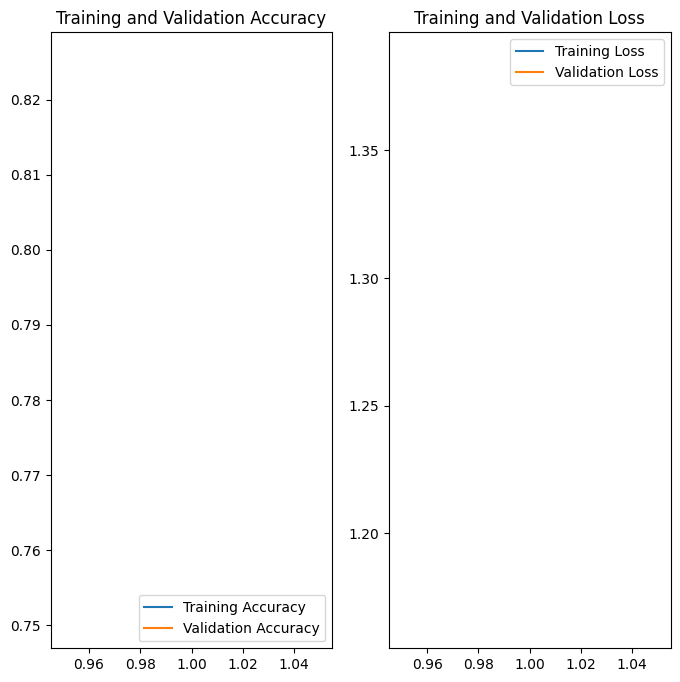

1101/1101 [==============================] - 3004s 3s/step - loss: 1.3853 - accuracy: 0.7507 - val_loss: 1.1658 - val_accuracy: 0.8252
Epoch 2/10
1101/1101 [==============================] - ETA: 0s - loss: 1.3380 - accuracy: 0.7582

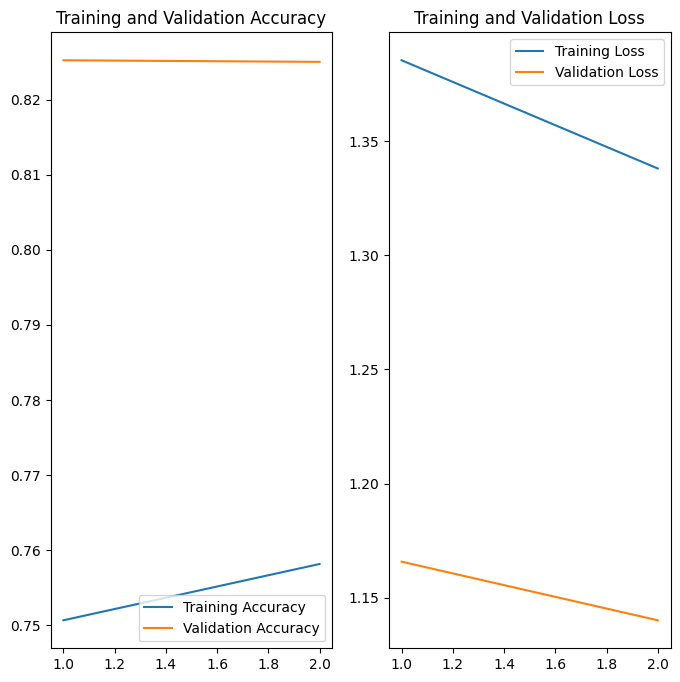

1101/1101 [==============================] - 3001s 3s/step - loss: 1.3380 - accuracy: 0.7582 - val_loss: 1.1401 - val_accuracy: 0.8250
Epoch 3/10
1101/1101 [==============================] - ETA: 0s - loss: 1.3291 - accuracy: 0.7582

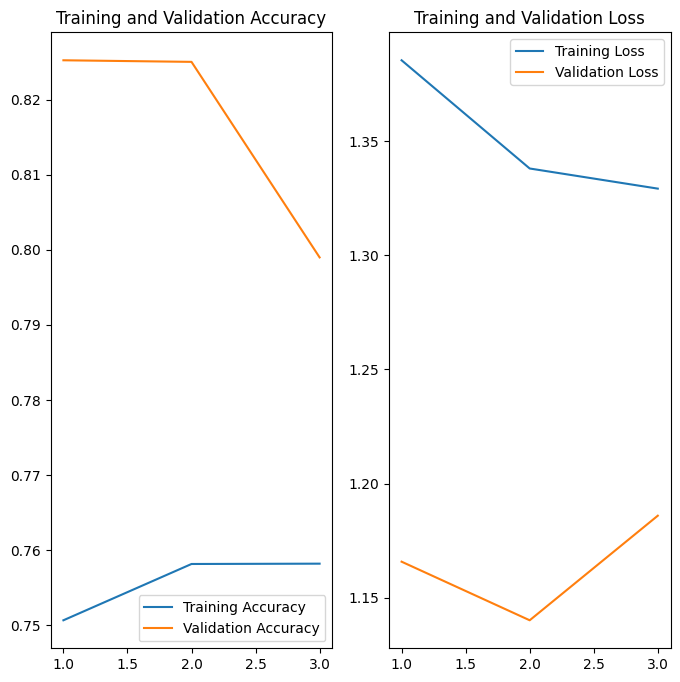

1101/1101 [==============================] - 2957s 3s/step - loss: 1.3291 - accuracy: 0.7582 - val_loss: 1.1859 - val_accuracy: 0.7990
Epoch 4/10
1101/1101 [==============================] - ETA: 0s - loss: 1.2984 - accuracy: 0.7633

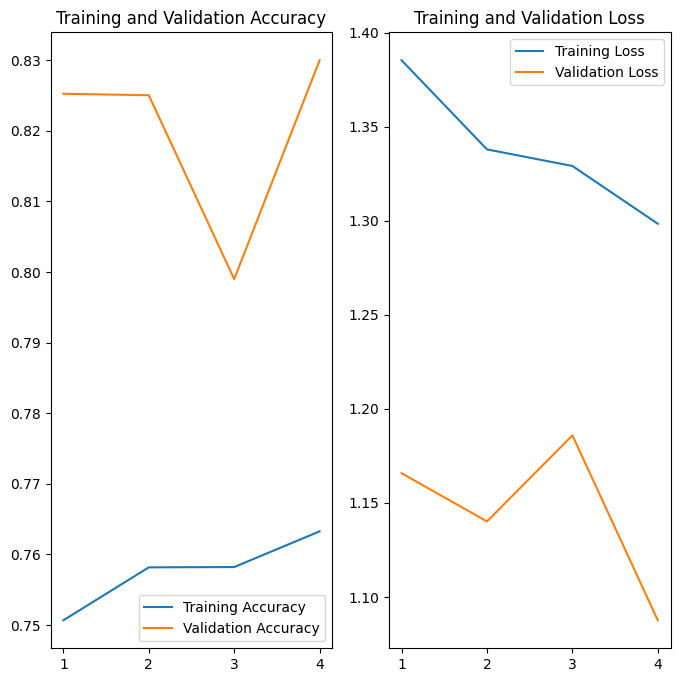

1101/1101 [==============================] - 3082s 3s/step - loss: 1.2984 - accuracy: 0.7633 - val_loss: 1.0876 - val_accuracy: 0.8300
Epoch 5/10
1101/1101 [==============================] - ETA: 0s - loss: 1.2887 - accuracy: 0.7617

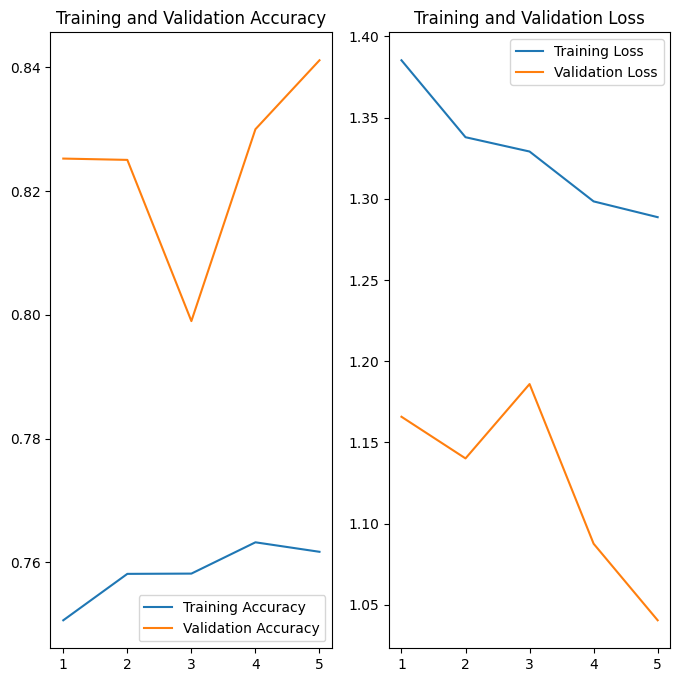

1101/1101 [==============================] - 3137s 3s/step - loss: 1.2887 - accuracy: 0.7617 - val_loss: 1.0405 - val_accuracy: 0.8411
Epoch 6/10
1101/1101 [==============================] - ETA: 0s - loss: 1.2873 - accuracy: 0.7578

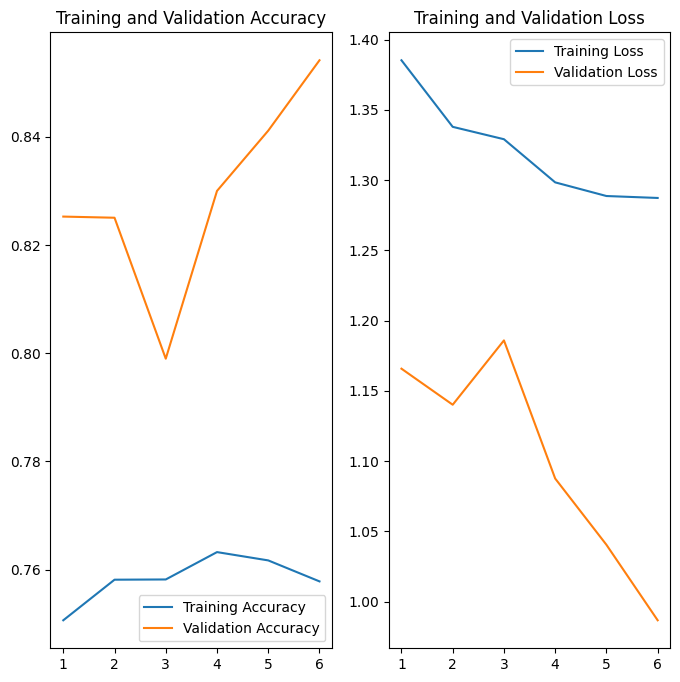

1101/1101 [==============================] - 3072s 3s/step - loss: 1.2873 - accuracy: 0.7578 - val_loss: 0.9867 - val_accuracy: 0.8541
Epoch 7/10
1101/1101 [==============================] - ETA: 0s - loss: 1.2676 - accuracy: 0.7592

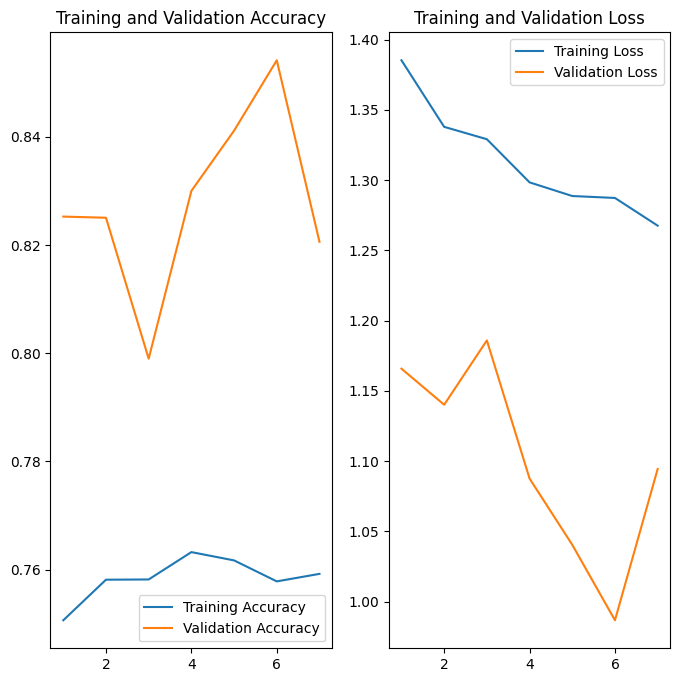

1101/1101 [==============================] - 2990s 3s/step - loss: 1.2676 - accuracy: 0.7592 - val_loss: 1.0944 - val_accuracy: 0.8206
Epoch 8/10
1101/1101 [==============================] - ETA: 0s - loss: 1.2542 - accuracy: 0.7640

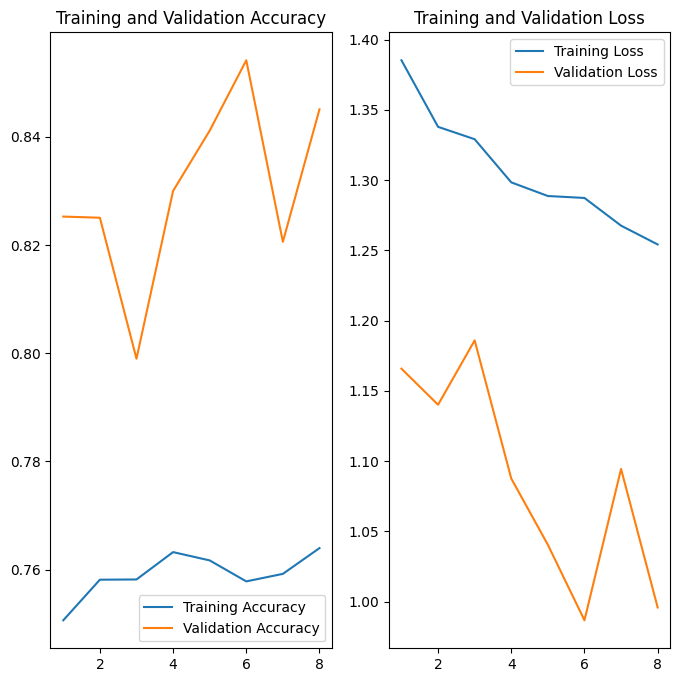

1101/1101 [==============================] - 2993s 3s/step - loss: 1.2542 - accuracy: 0.7640 - val_loss: 0.9958 - val_accuracy: 0.8451
Epoch 9/10
1101/1101 [==============================] - ETA: 0s - loss: 1.2437 - accuracy: 0.7658

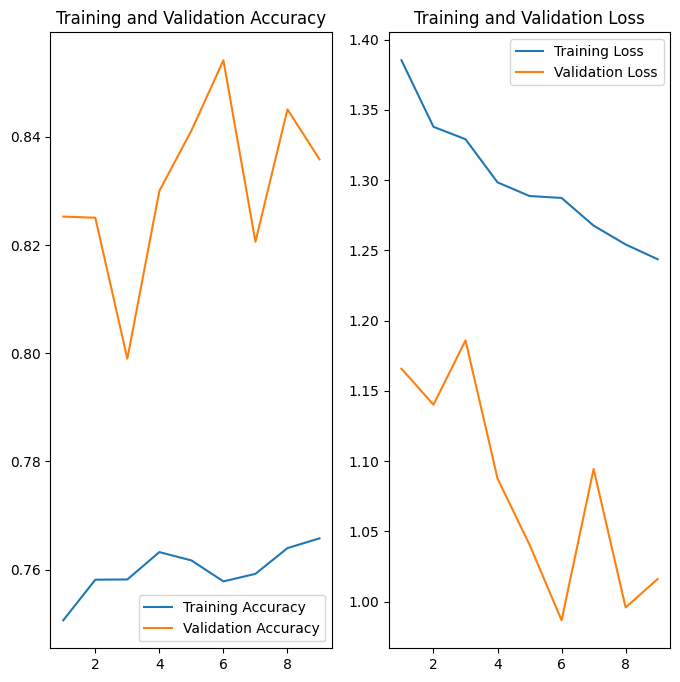

1101/1101 [==============================] - 2953s 3s/step - loss: 1.2437 - accuracy: 0.7658 - val_loss: 1.0161 - val_accuracy: 0.8358
Epoch 10/10
1101/1101 [==============================] - ETA: 0s - loss: 1.2595 - accuracy: 0.7571

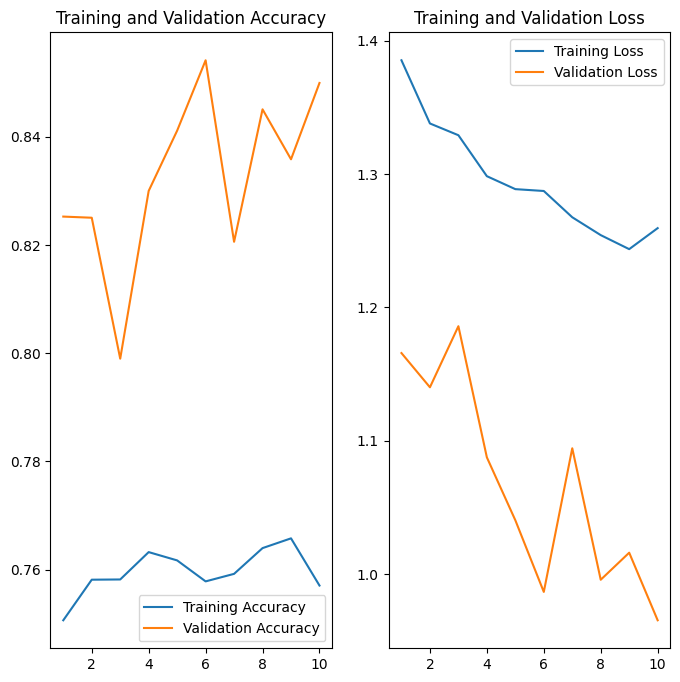

1101/1101 [==============================] - 3099s 3s/step - loss: 1.2595 - accuracy: 0.7571 - val_loss: 0.9654 - val_accuracy: 0.8499


In [12]:
# สร้างตัวเก็บข้อมูลสำหรับ accuracy และ loss ในแต่ละ epoch
acc_list = []
val_acc_list = []
loss_list = []
val_loss_list = []

# ฟังก์ชันสำหรับ plot graph หลังจบแต่ละ epoch
def plot_graphs(epoch, logs):
    # ใช้ logs เพื่อดึงค่าของ accuracy และ loss ในแต่ละ epoch
    acc_list.append(logs.get('accuracy'))
    val_acc_list.append(logs.get('val_accuracy'))
    loss_list.append(logs.get('loss'))
    val_loss_list.append(logs.get('val_loss'))

    # กำหนดช่วง epoch ที่ผ่านไปแล้ว
    epochs_range = range(1, epoch + 2)  # บวก 1 เพื่อครอบคลุม epoch ปัจจุบัน

    plt.figure(figsize=(8, 8))
    
    # Plot Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc_list, label='Training Accuracy')
    plt.plot(epochs_range, val_acc_list, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')
    
    # Plot Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss_list, label='Training Loss')
    plt.plot(epochs_range, val_loss_list, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    
    plt.show()

# สร้าง callback ที่จะทำการ plot ทุกครั้งที่จบ epoch
plot_callback = LambdaCallback(on_epoch_end=lambda epoch, logs: plot_graphs(epoch, logs))


  

In [25]:
from tensorflow.keras.preprocessing import image


img_path = r'C:\Users\supha\Documents\65011048\fruits-360_dataset_original-size\fruits-360-original-size\Test\carrot_1\r0_3.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

prediction = model.predict(img_array)
predicted_class = np.argmax(prediction, axis=1)
class_labels = list(train_generator.class_indices.keys())

print(f'predict: {class_labels[predicted_class[0]]}')


1/1 [==============================] - 0s 54ms/step
predict: Onion Red 1


In [38]:
import requests
from io import BytesIO
from PIL import Image
import numpy as np
from tensorflow.keras.preprocessing import image


url = 'https://cdn.mos.cms.futurecdn.net/38Moe9n3b72uVEf2Ti7KmV.jpg'


response = requests.get(url)
img = Image.open(BytesIO(response.content))


img = img.resize((224, 224))


img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)


prediction = model.predict(img_array)
predicted_class = np.argmax(prediction, axis=1)
class_labels = list(train_generator.class_indices.keys())

print(f'predict: {class_labels[predicted_class[0]]}')


1/1 [==============================] - 0s 56ms/step
predict: Apple Red Yellow 1


1/1 [==============================] - 0s 51ms/step


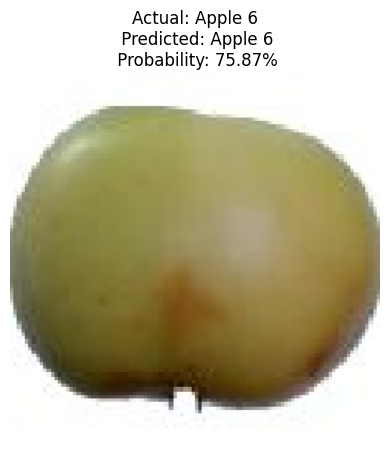

1/1 [==============================] - 0s 56ms/step


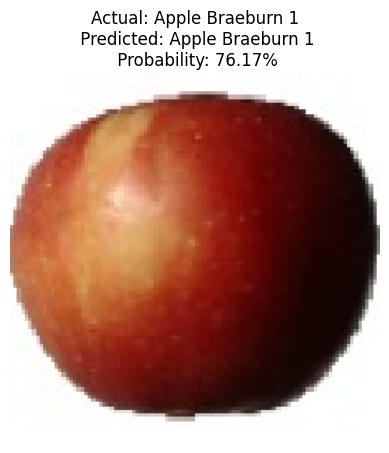

1/1 [==============================] - 0s 52ms/step


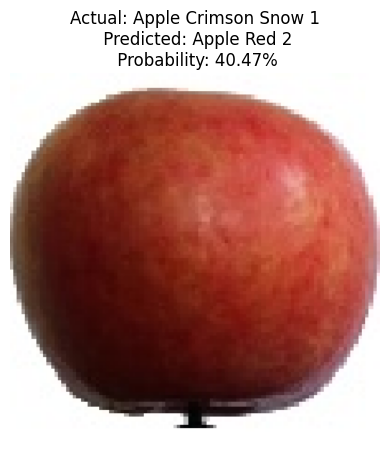

1/1 [==============================] - 0s 61ms/step


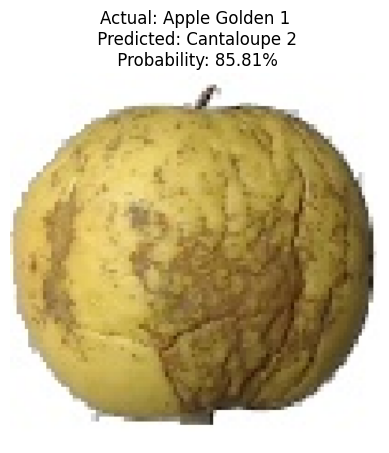

1/1 [==============================] - 0s 61ms/step


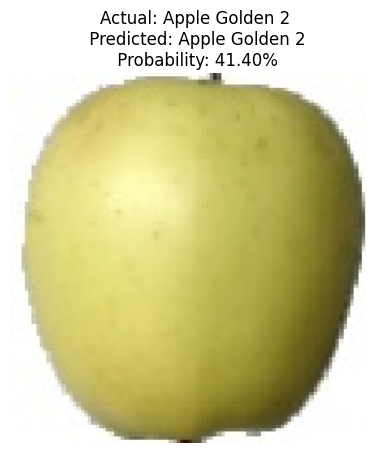

1/1 [==============================] - 0s 71ms/step


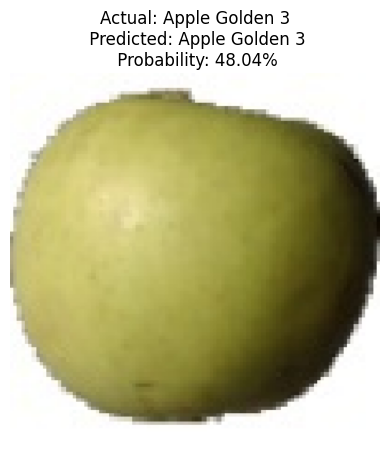

1/1 [==============================] - 0s 59ms/step


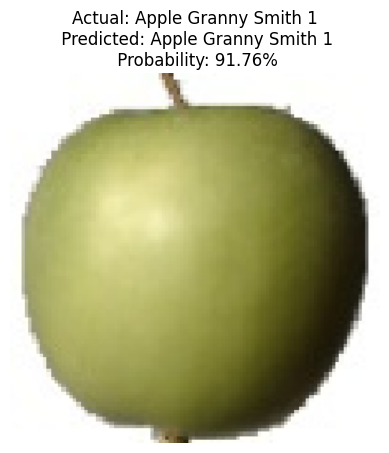

1/1 [==============================] - 0s 54ms/step


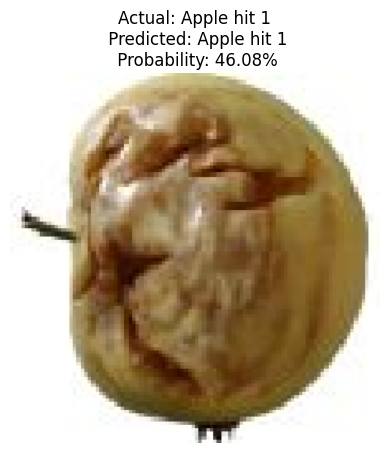

1/1 [==============================] - 0s 65ms/step


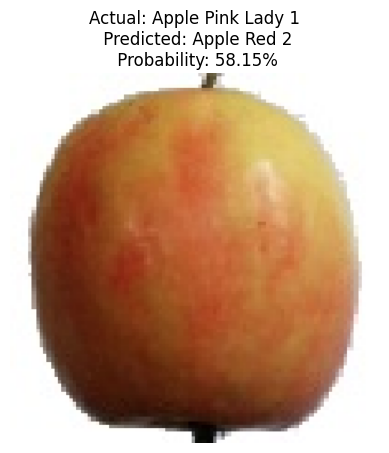

1/1 [==============================] - 0s 85ms/step


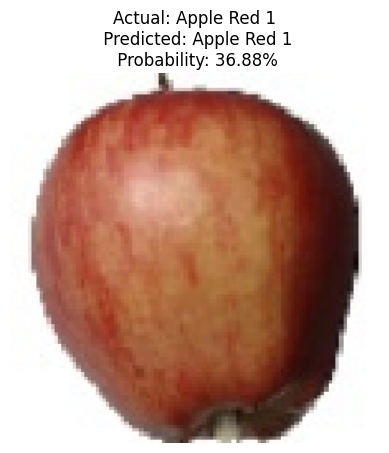

1/1 [==============================] - 0s 66ms/step


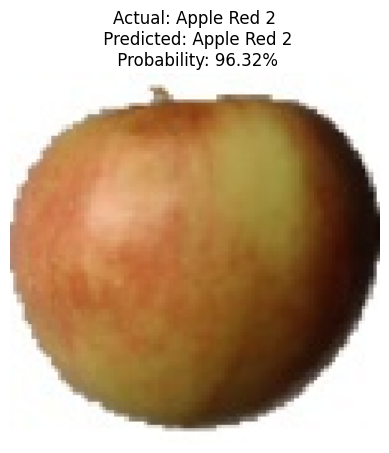

1/1 [==============================] - 0s 69ms/step


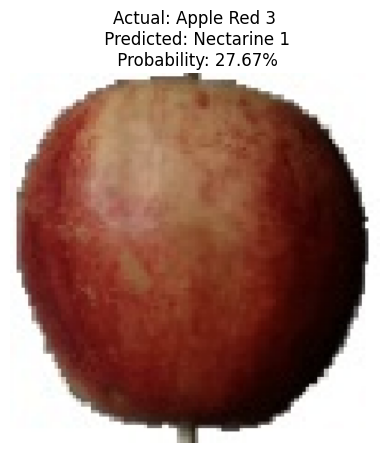

1/1 [==============================] - 0s 62ms/step


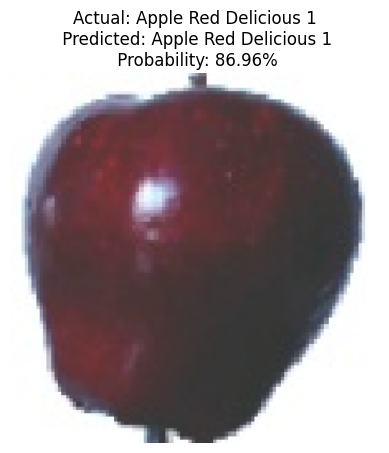

1/1 [==============================] - 0s 63ms/step


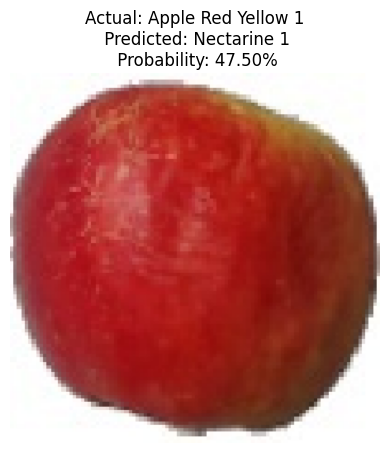

1/1 [==============================] - 0s 74ms/step


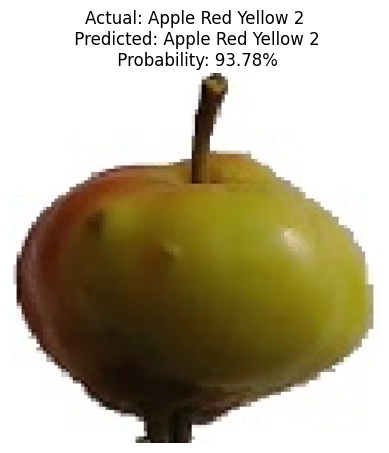

1/1 [==============================] - 0s 69ms/step


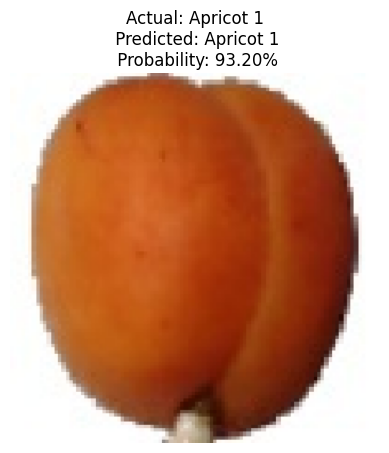

1/1 [==============================] - 0s 69ms/step


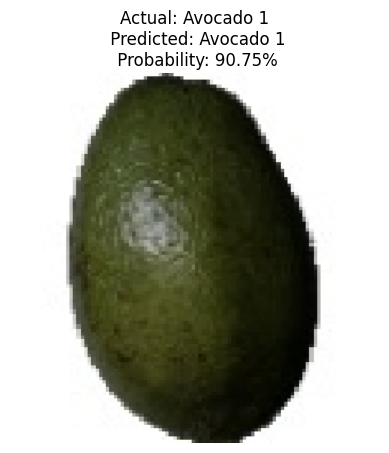

1/1 [==============================] - 0s 75ms/step


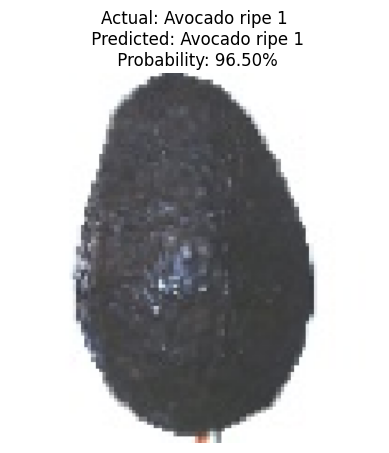

1/1 [==============================] - 0s 62ms/step


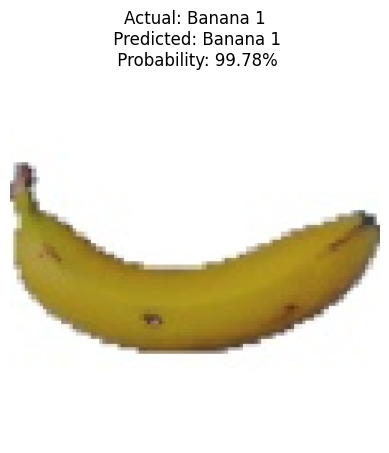

1/1 [==============================] - 0s 60ms/step


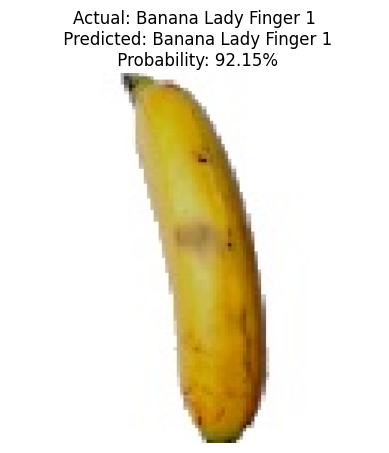

1/1 [==============================] - 0s 61ms/step


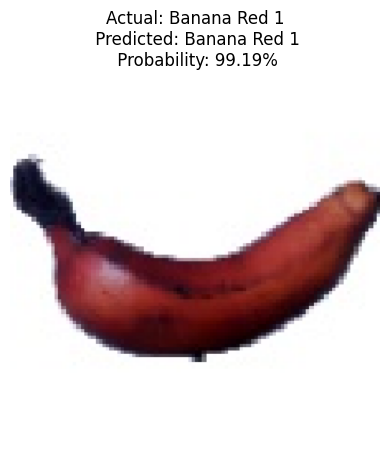

1/1 [==============================] - 0s 70ms/step


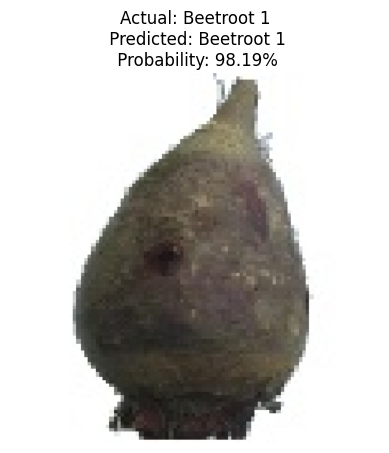

1/1 [==============================] - 0s 57ms/step


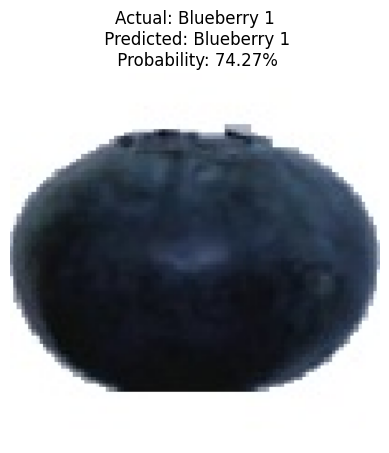

1/1 [==============================] - 0s 58ms/step


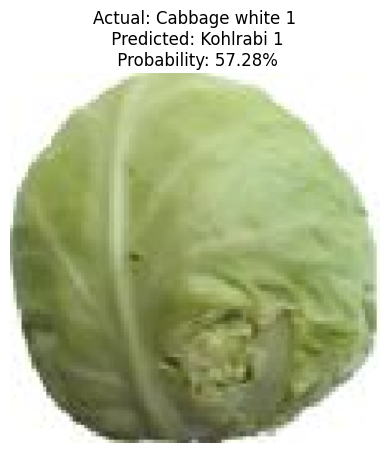

1/1 [==============================] - 0s 56ms/step


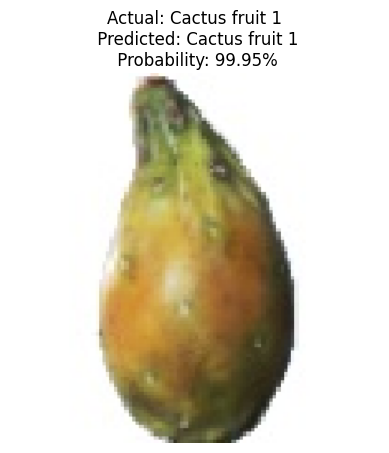

1/1 [==============================] - 0s 60ms/step


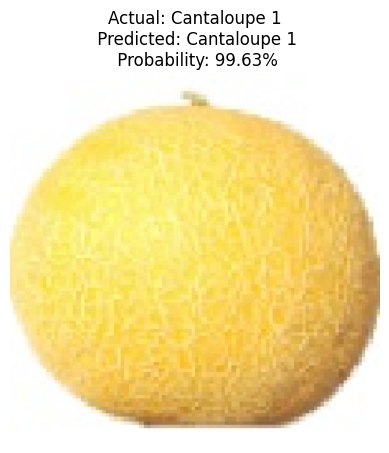

1/1 [==============================] - 0s 57ms/step


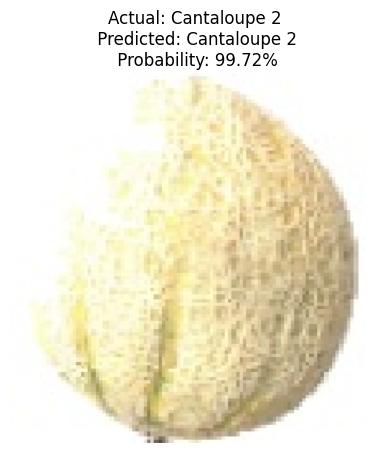

1/1 [==============================] - 0s 55ms/step


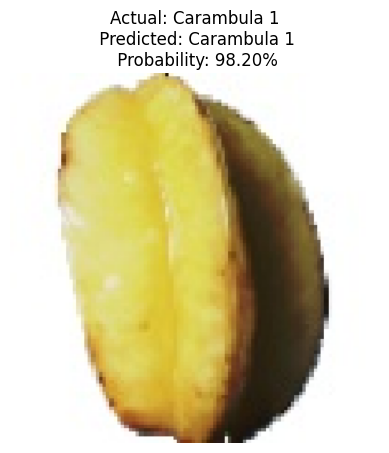

1/1 [==============================] - 0s 57ms/step


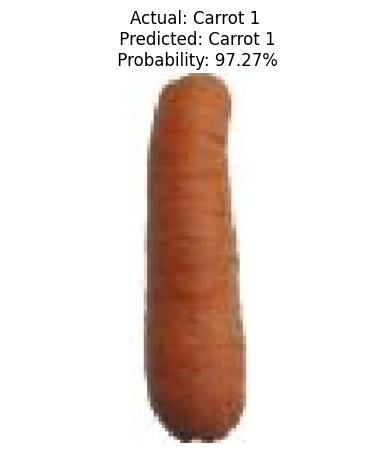

1/1 [==============================] - 0s 57ms/step


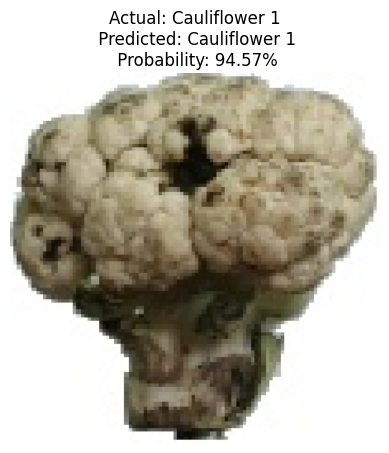

1/1 [==============================] - 0s 54ms/step


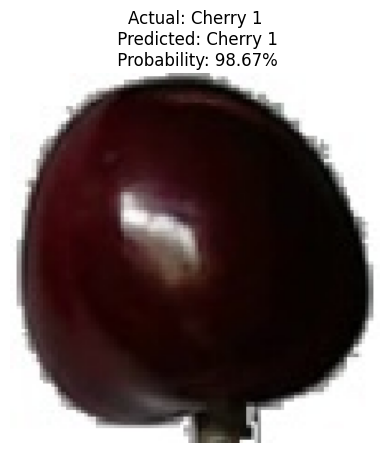

1/1 [==============================] - 0s 60ms/step


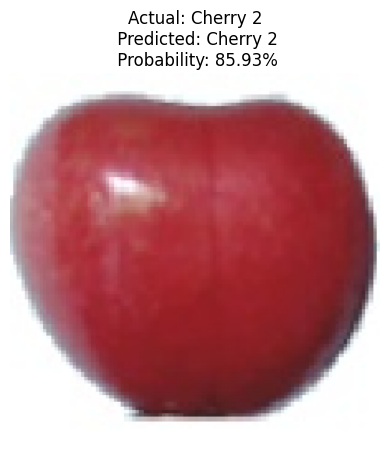

1/1 [==============================] - 0s 58ms/step


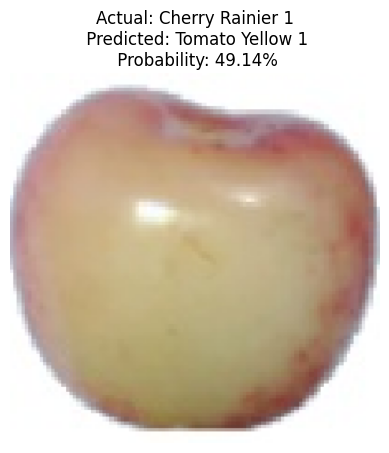

1/1 [==============================] - 0s 59ms/step


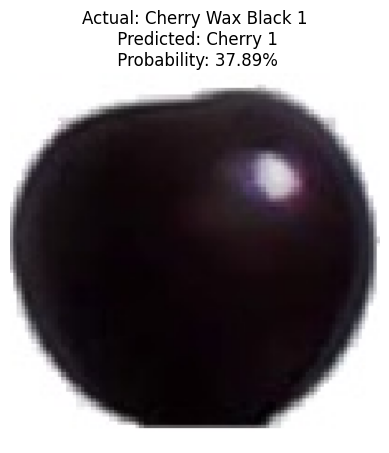

1/1 [==============================] - 0s 67ms/step


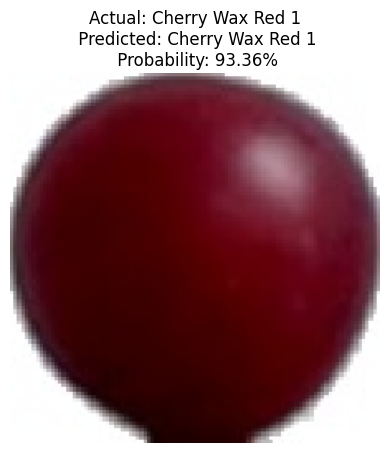

1/1 [==============================] - 0s 59ms/step


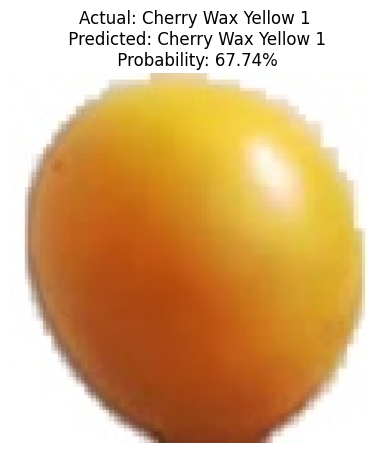

1/1 [==============================] - 0s 59ms/step


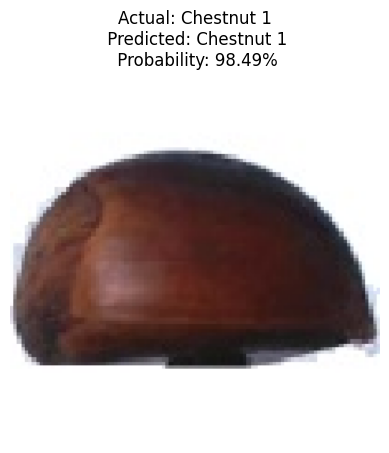

1/1 [==============================] - 0s 58ms/step


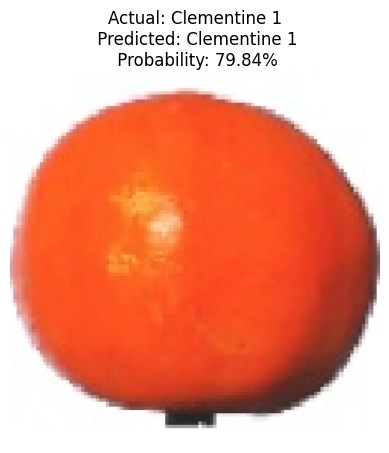

1/1 [==============================] - 0s 67ms/step


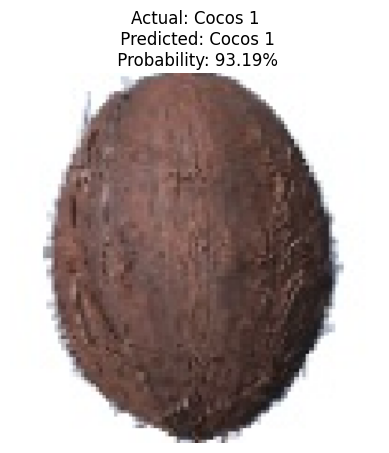

1/1 [==============================] - 0s 57ms/step


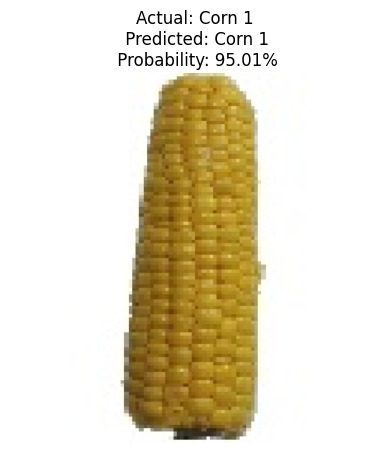

1/1 [==============================] - 0s 56ms/step


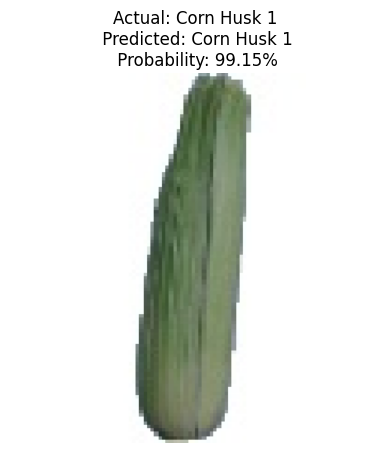

1/1 [==============================] - 0s 56ms/step


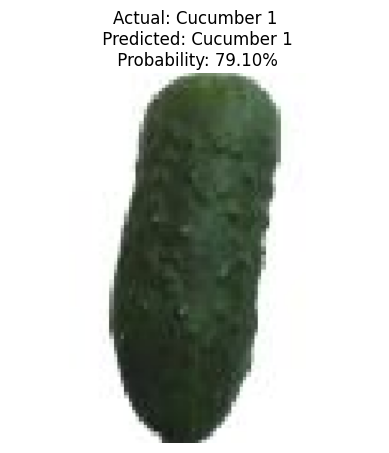

1/1 [==============================] - 0s 56ms/step


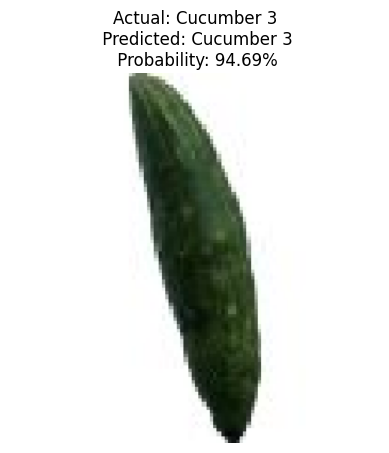

1/1 [==============================] - 0s 57ms/step


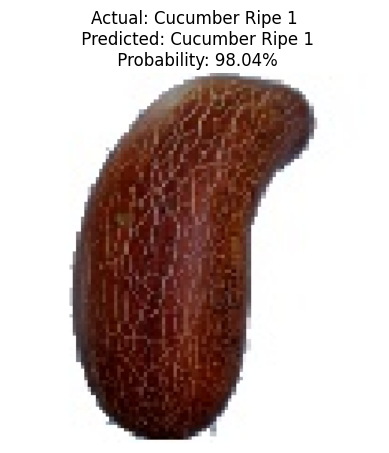

1/1 [==============================] - 0s 54ms/step


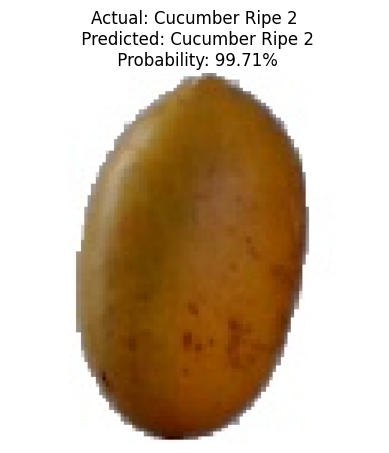

1/1 [==============================] - 0s 55ms/step


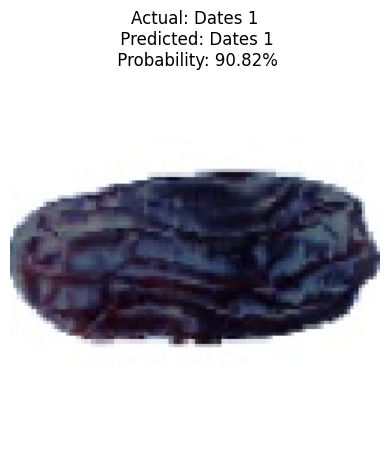

1/1 [==============================] - 0s 54ms/step


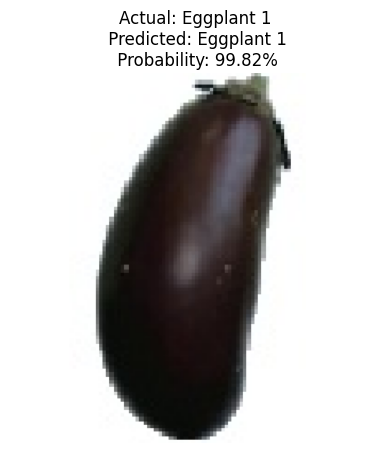

1/1 [==============================] - 0s 55ms/step


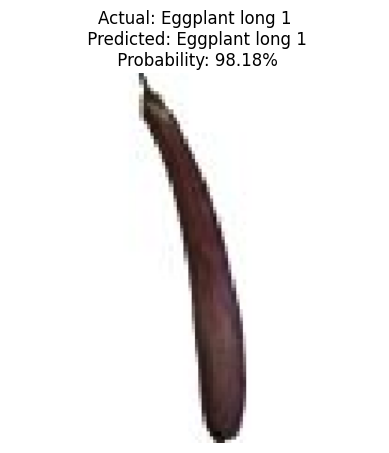

1/1 [==============================] - 0s 58ms/step


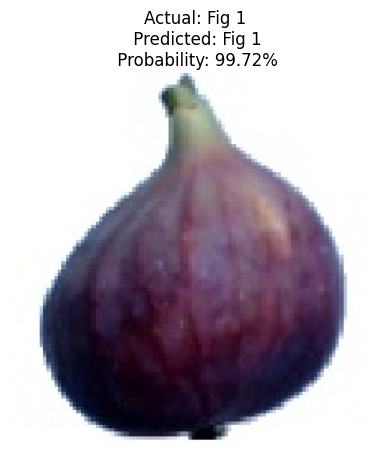

1/1 [==============================] - 0s 55ms/step


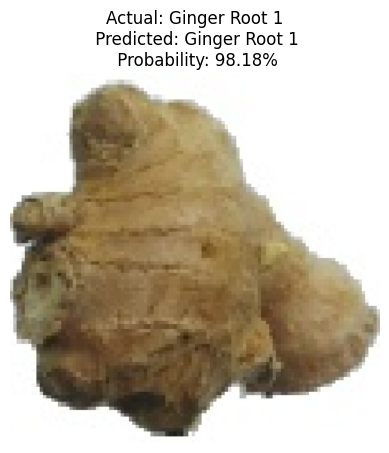

1/1 [==============================] - 0s 56ms/step


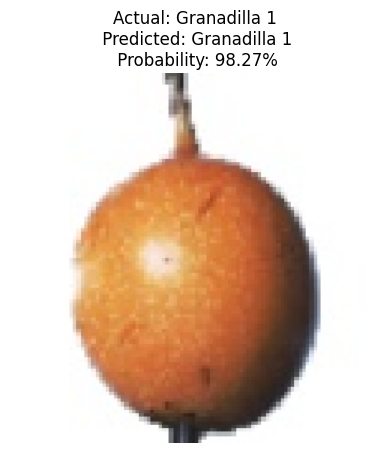

1/1 [==============================] - 0s 58ms/step


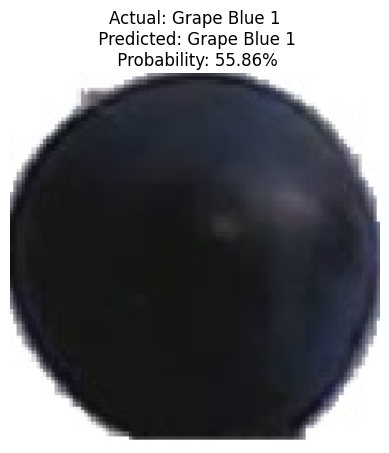

1/1 [==============================] - 0s 58ms/step


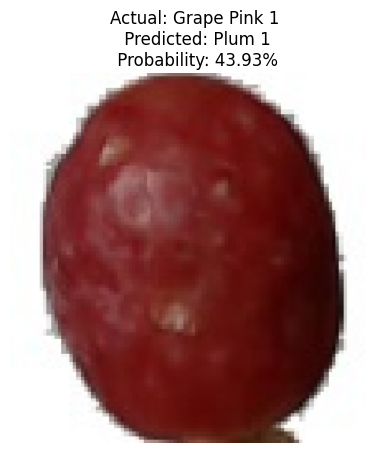

1/1 [==============================] - 0s 53ms/step


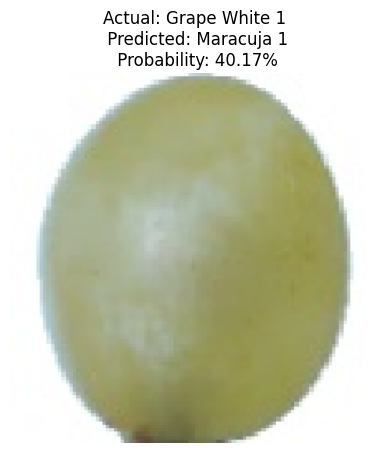

1/1 [==============================] - 0s 58ms/step


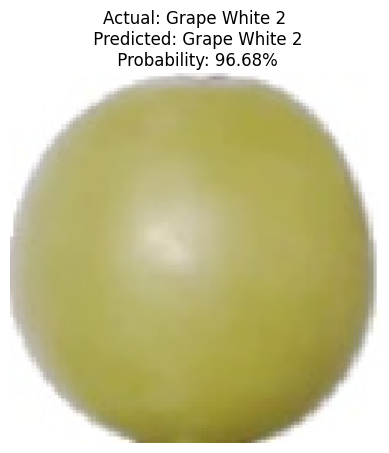

1/1 [==============================] - 0s 57ms/step


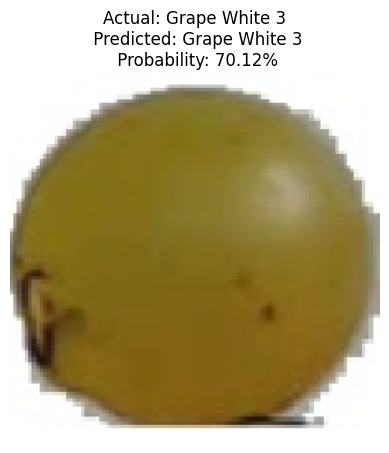

1/1 [==============================] - 0s 53ms/step


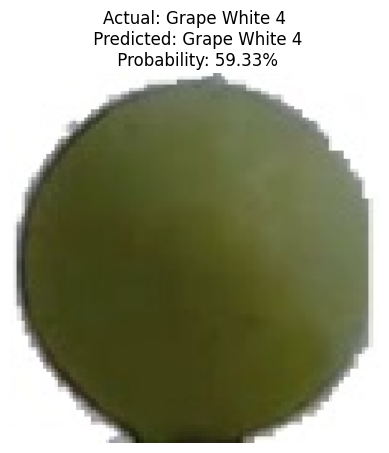

1/1 [==============================] - 0s 62ms/step


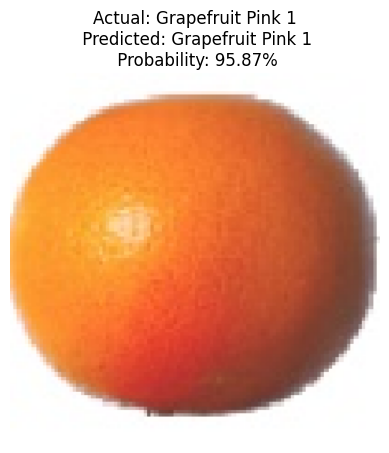

1/1 [==============================] - 0s 57ms/step


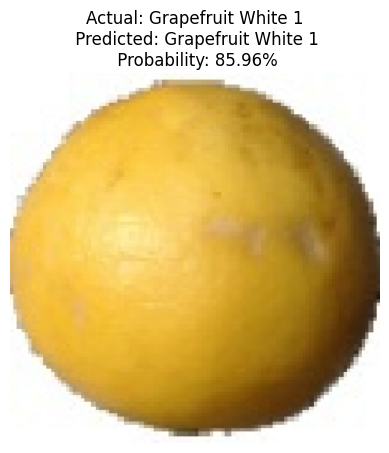

1/1 [==============================] - 0s 57ms/step


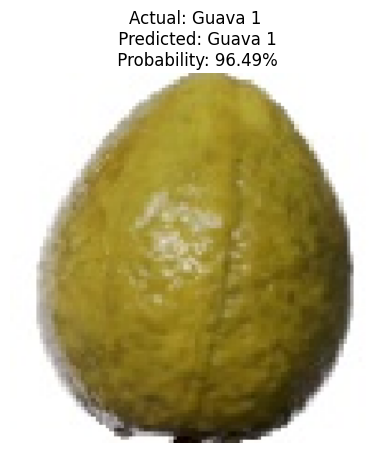

1/1 [==============================] - 0s 55ms/step


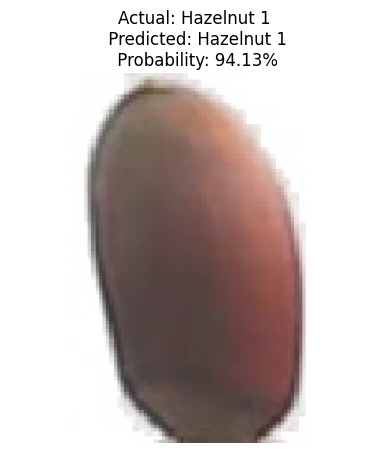

1/1 [==============================] - 0s 63ms/step


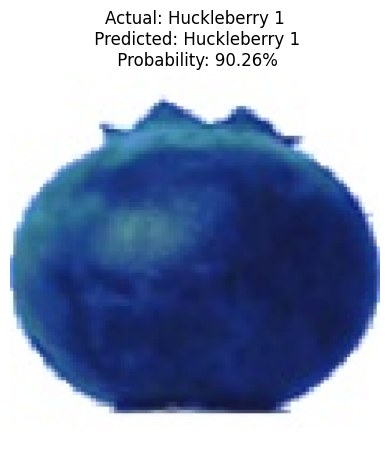

1/1 [==============================] - 0s 58ms/step


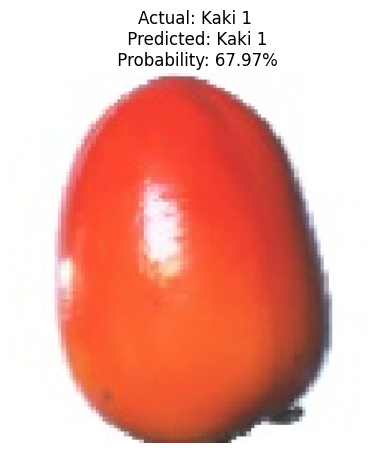

1/1 [==============================] - 0s 54ms/step


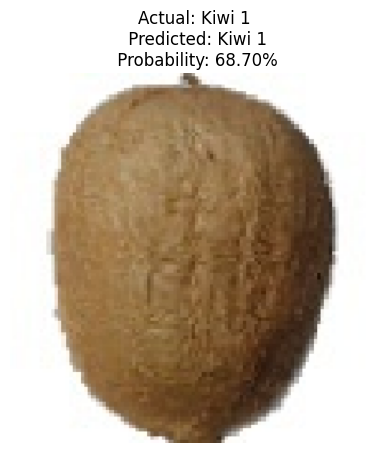

1/1 [==============================] - 0s 59ms/step


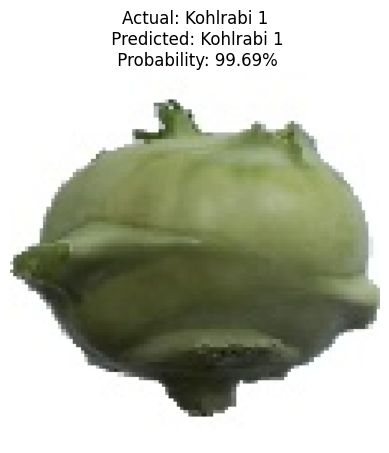

1/1 [==============================] - 0s 57ms/step


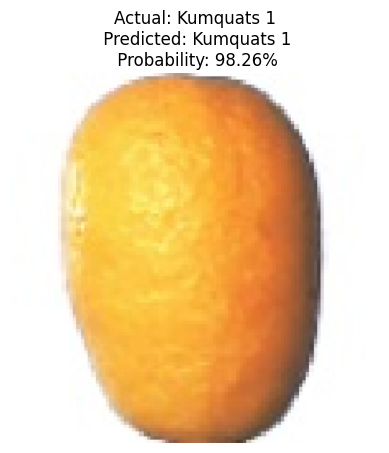

1/1 [==============================] - 0s 55ms/step


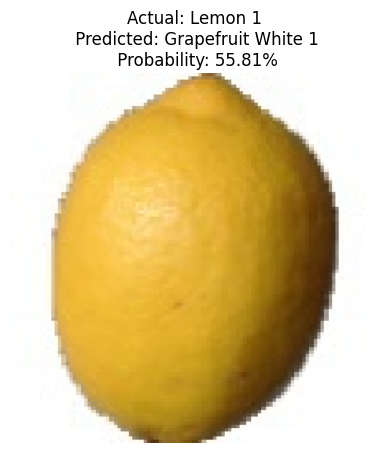

1/1 [==============================] - 0s 54ms/step


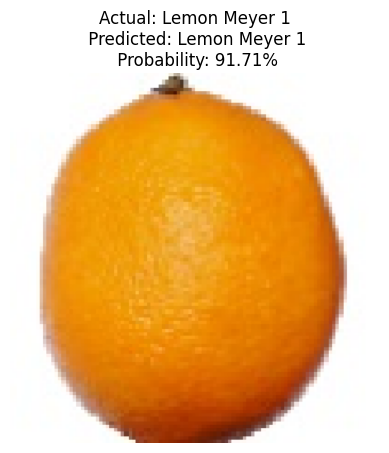

1/1 [==============================] - 0s 52ms/step


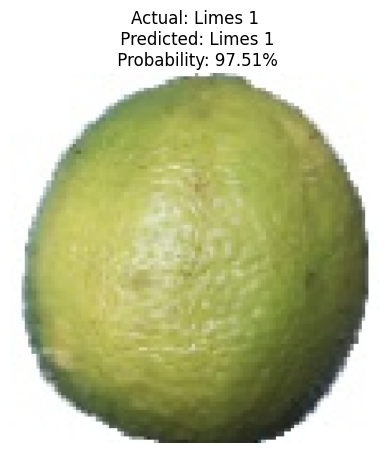

1/1 [==============================] - 0s 55ms/step


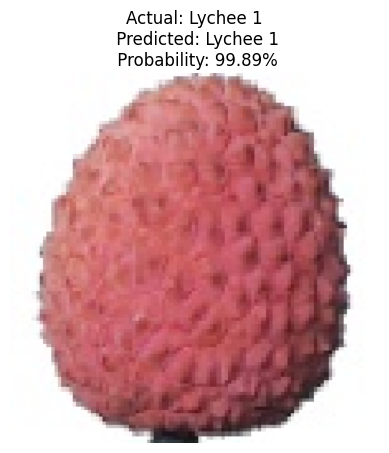

1/1 [==============================] - 0s 55ms/step


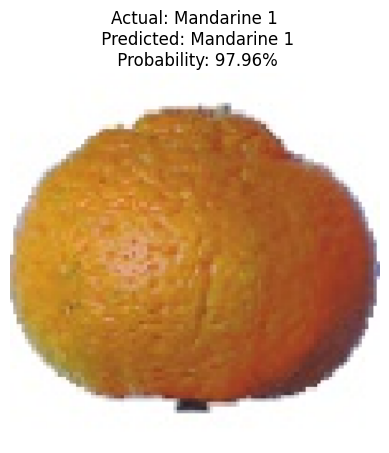

1/1 [==============================] - 0s 55ms/step


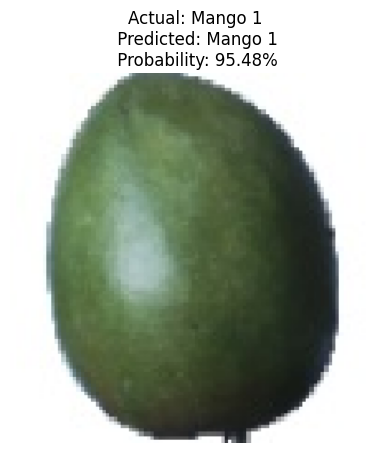

1/1 [==============================] - 0s 67ms/step


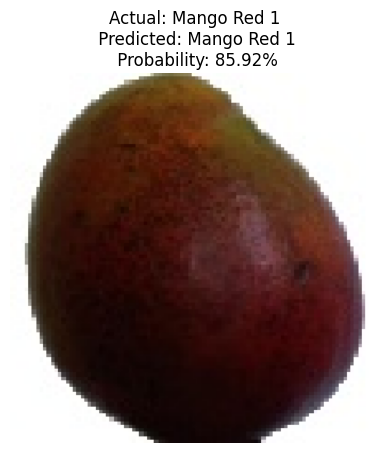

1/1 [==============================] - 0s 63ms/step


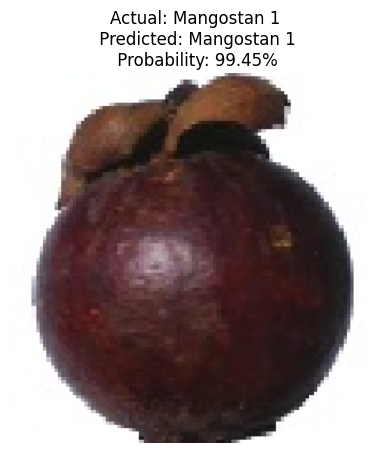

1/1 [==============================] - 0s 62ms/step


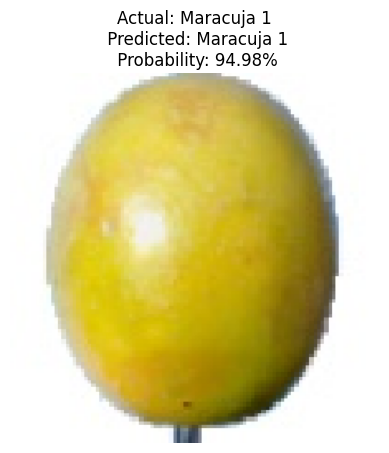

1/1 [==============================] - 0s 60ms/step


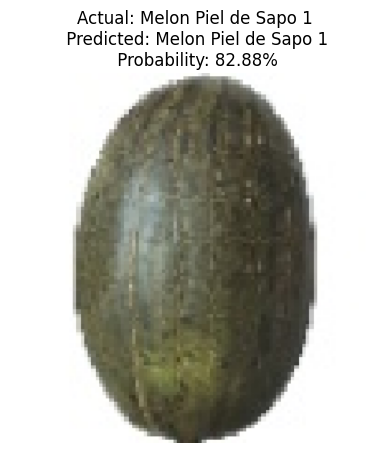

1/1 [==============================] - 0s 76ms/step


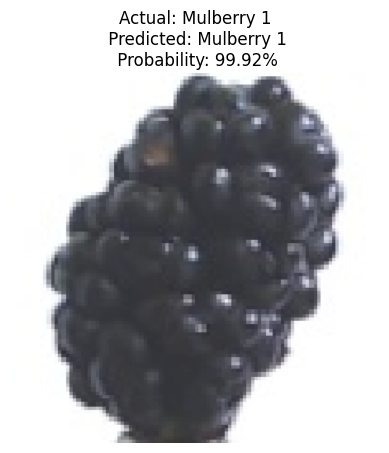

1/1 [==============================] - 0s 64ms/step


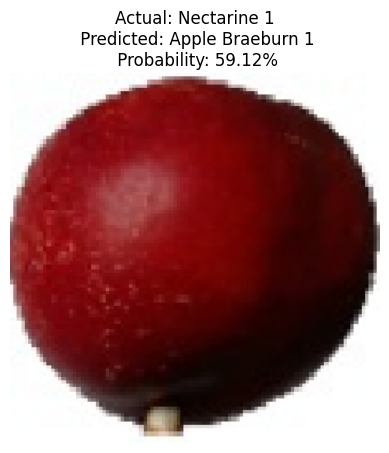

1/1 [==============================] - 0s 63ms/step


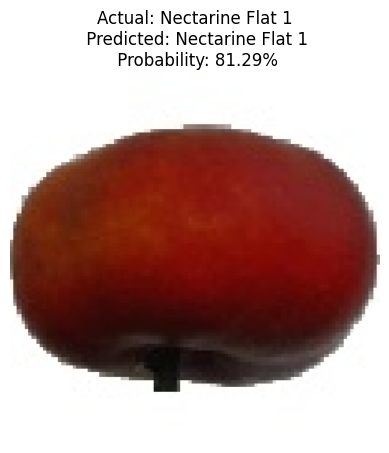

1/1 [==============================] - 0s 73ms/step


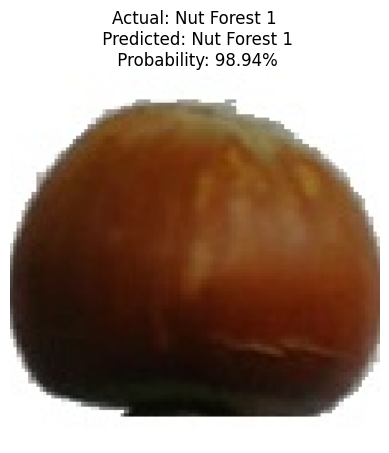

1/1 [==============================] - 0s 60ms/step


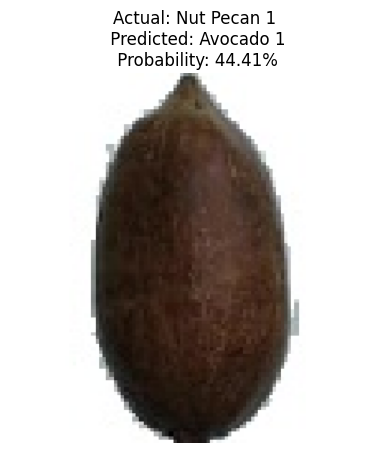

1/1 [==============================] - 0s 61ms/step


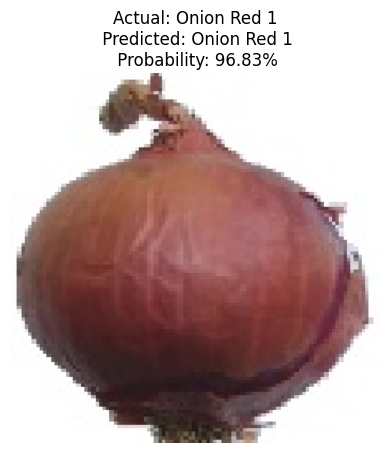

1/1 [==============================] - 0s 74ms/step


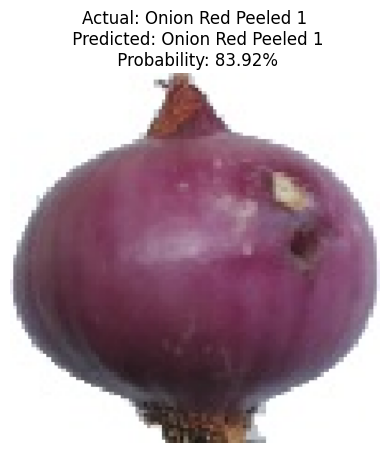

1/1 [==============================] - 0s 60ms/step


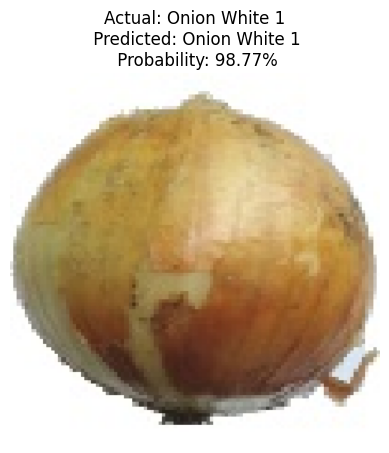

1/1 [==============================] - 0s 57ms/step


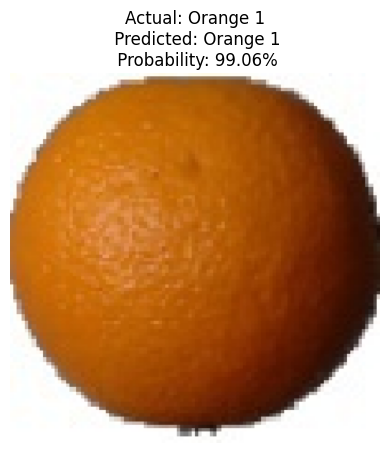

1/1 [==============================] - 0s 69ms/step


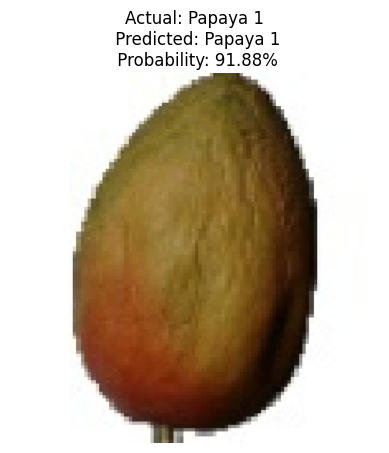

1/1 [==============================] - 0s 53ms/step


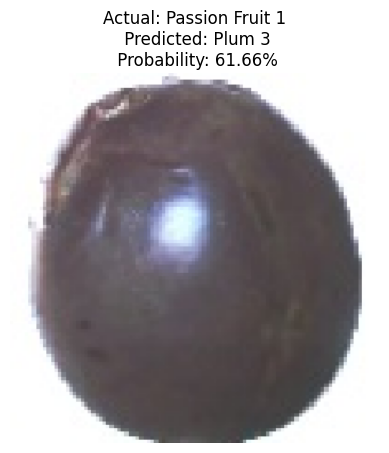

1/1 [==============================] - 0s 57ms/step


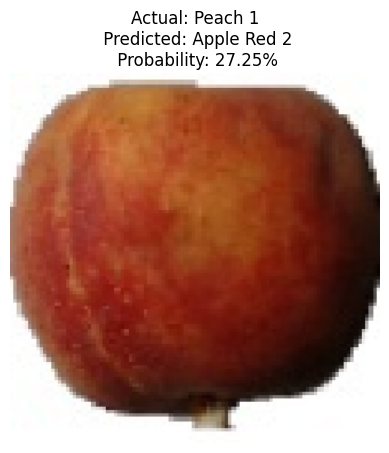

1/1 [==============================] - 0s 57ms/step


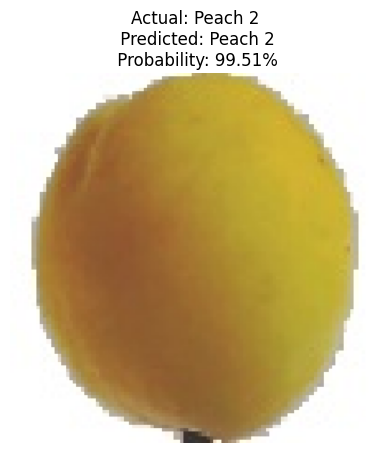

1/1 [==============================] - 0s 79ms/step


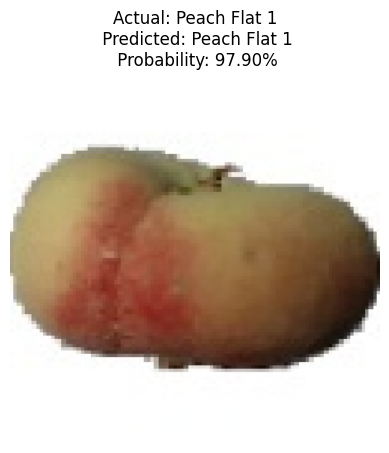

1/1 [==============================] - 0s 58ms/step


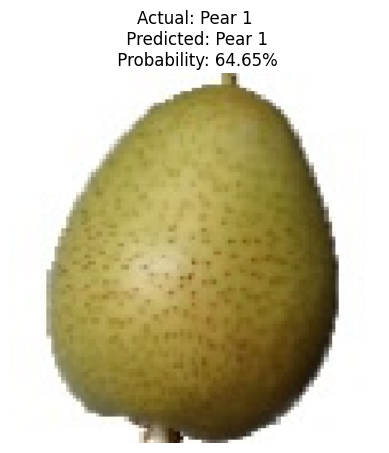

1/1 [==============================] - 0s 62ms/step


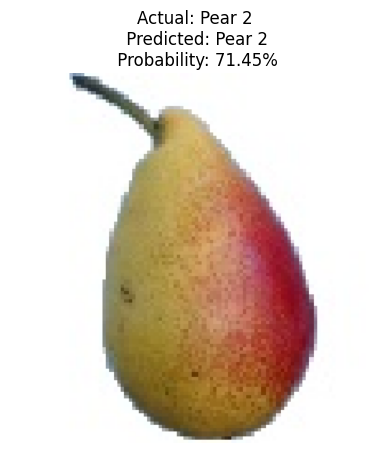

1/1 [==============================] - 0s 59ms/step


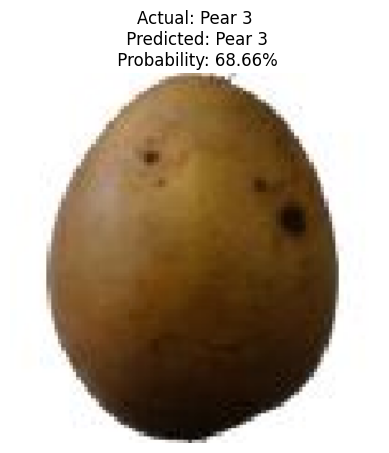

1/1 [==============================] - 0s 57ms/step


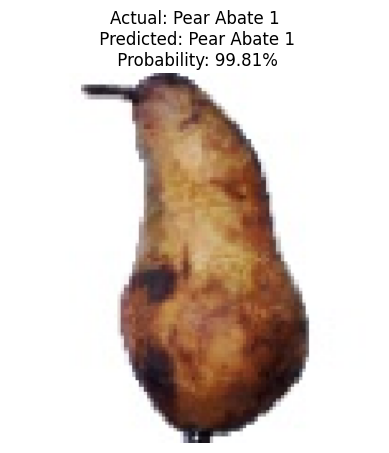

1/1 [==============================] - 0s 78ms/step


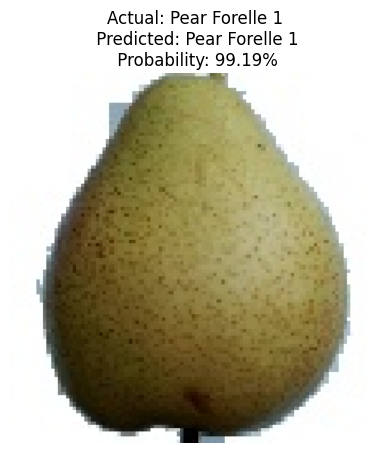

1/1 [==============================] - 0s 61ms/step


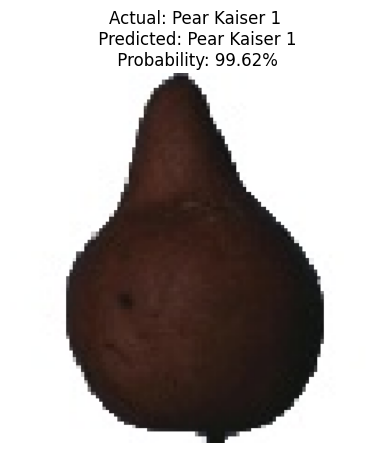

1/1 [==============================] - 0s 58ms/step


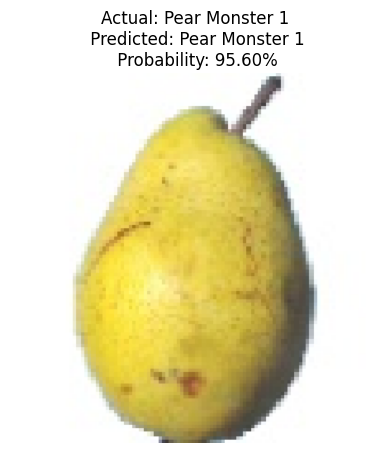

1/1 [==============================] - 0s 57ms/step


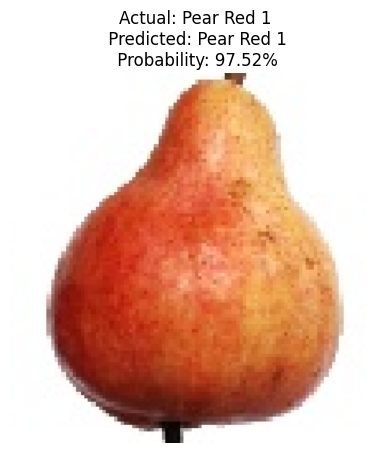

1/1 [==============================] - 0s 59ms/step


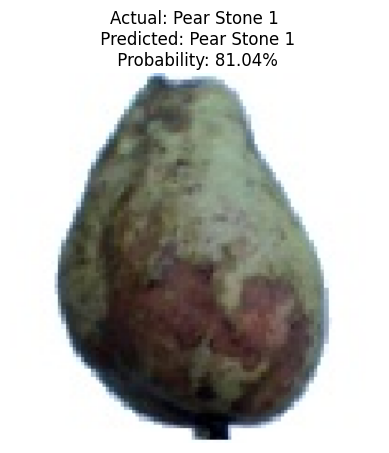

1/1 [==============================] - 0s 104ms/step


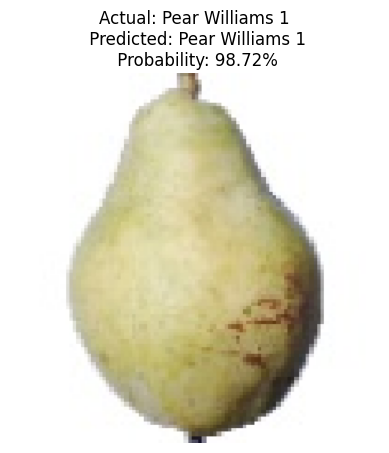

1/1 [==============================] - 0s 77ms/step


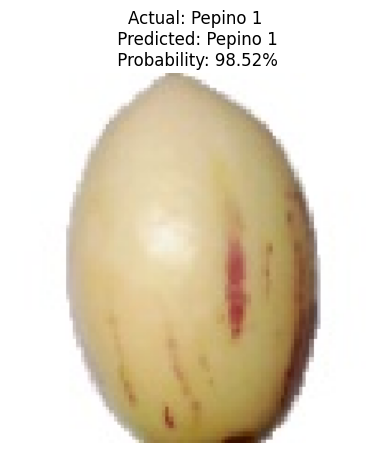

1/1 [==============================] - 0s 59ms/step


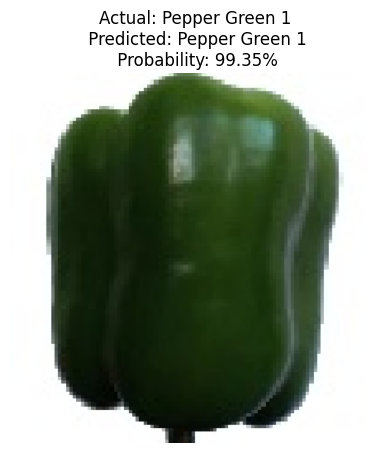

1/1 [==============================] - 0s 60ms/step


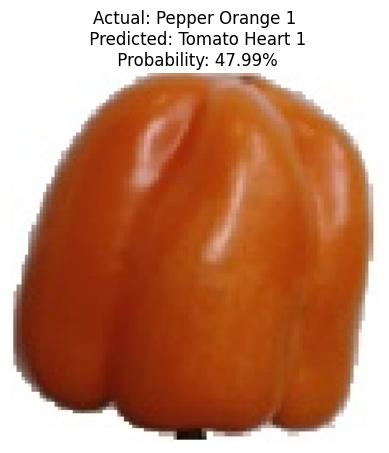

1/1 [==============================] - 0s 78ms/step


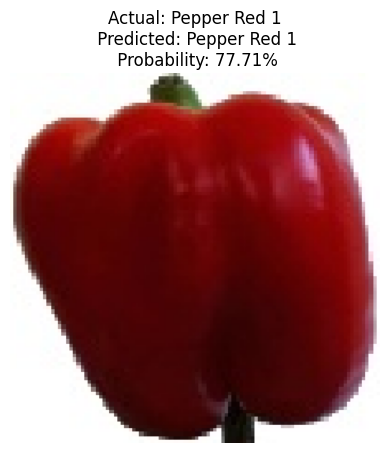

1/1 [==============================] - 0s 60ms/step


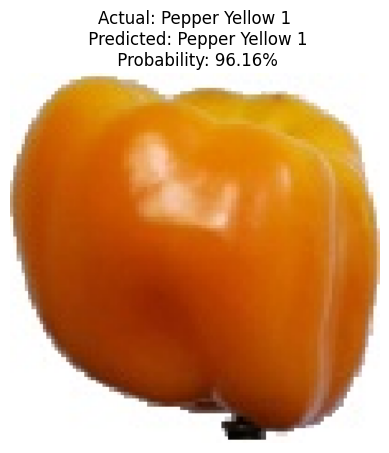

1/1 [==============================] - 0s 60ms/step


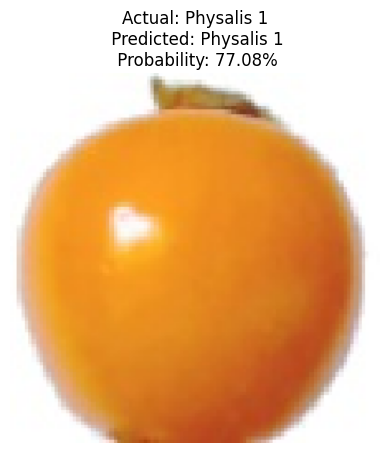

1/1 [==============================] - 0s 62ms/step


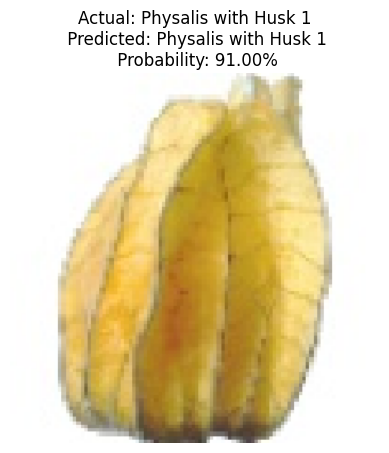

1/1 [==============================] - 0s 65ms/step


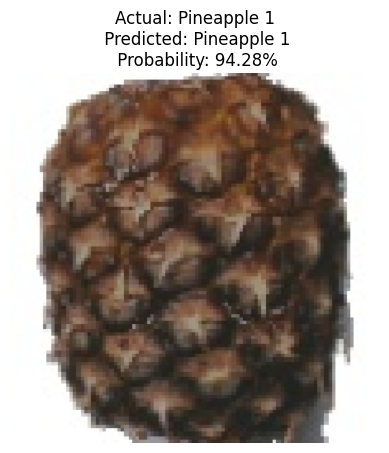

1/1 [==============================] - 0s 61ms/step


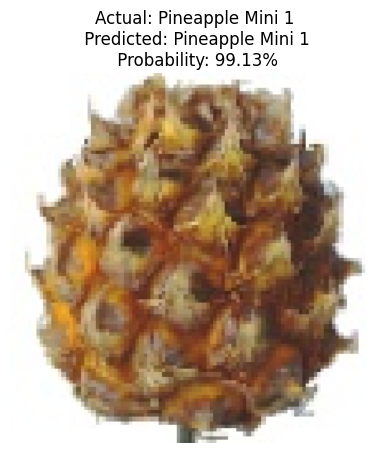

1/1 [==============================] - 0s 59ms/step


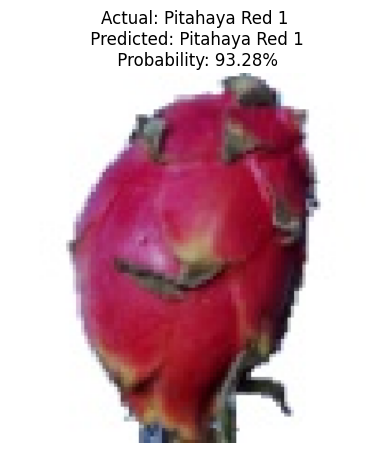

1/1 [==============================] - 0s 63ms/step


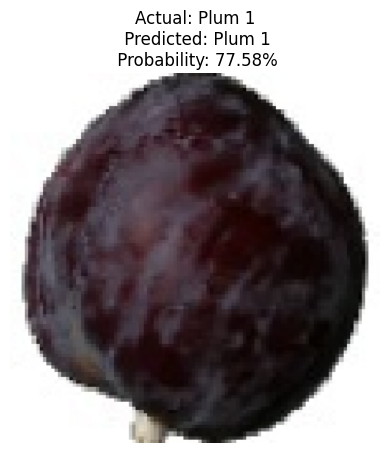

1/1 [==============================] - 0s 73ms/step


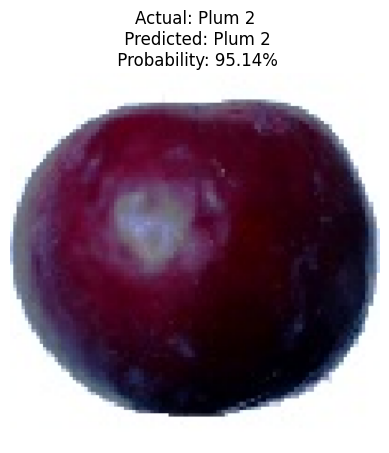

1/1 [==============================] - 0s 63ms/step


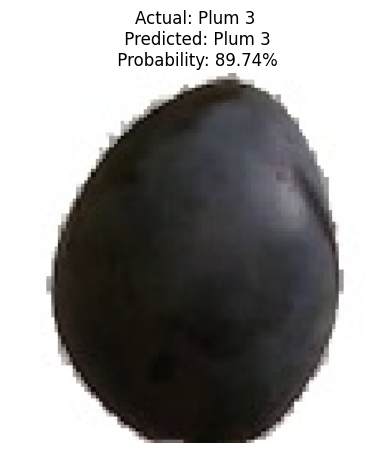

1/1 [==============================] - 0s 63ms/step


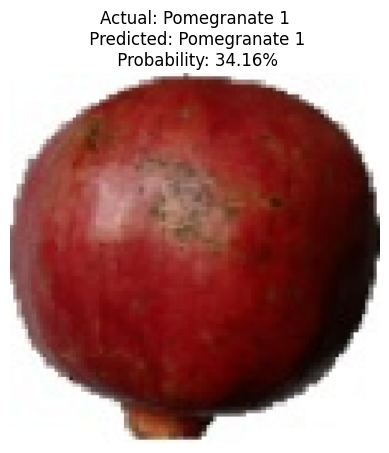

1/1 [==============================] - 0s 56ms/step


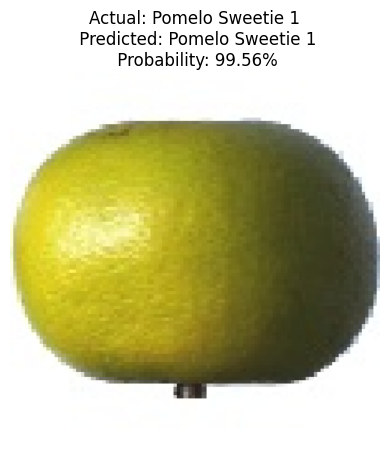

1/1 [==============================] - 0s 58ms/step


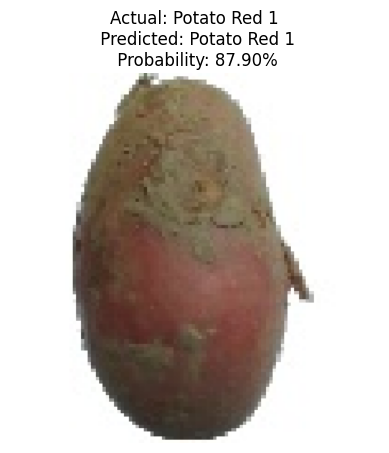

1/1 [==============================] - 0s 75ms/step


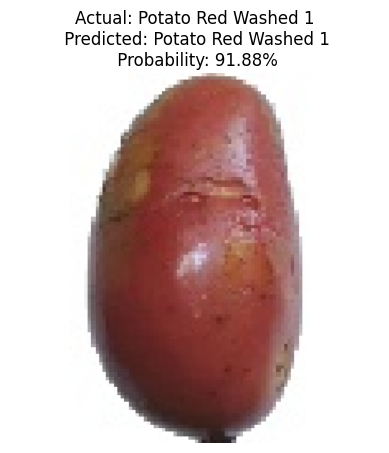

1/1 [==============================] - 0s 59ms/step


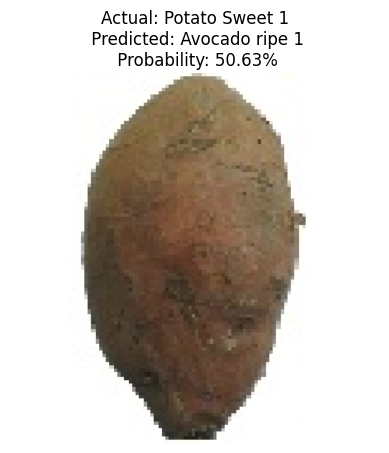

1/1 [==============================] - 0s 60ms/step


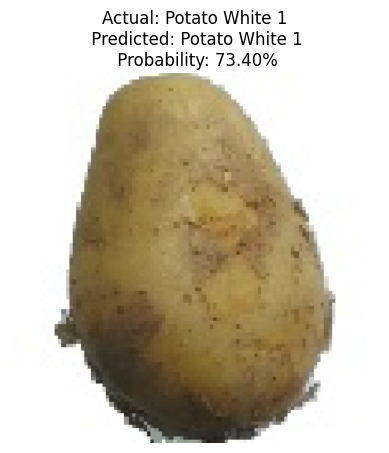

1/1 [==============================] - 0s 67ms/step


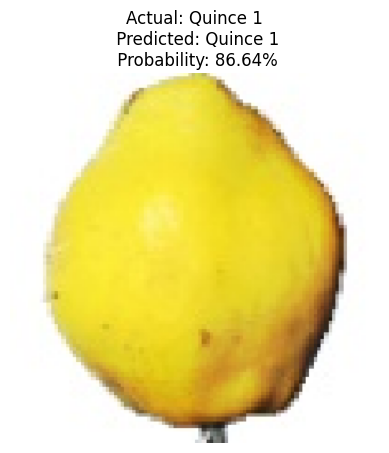

1/1 [==============================] - 0s 60ms/step


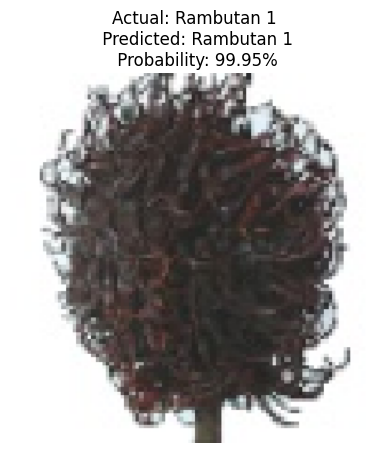

1/1 [==============================] - 0s 58ms/step


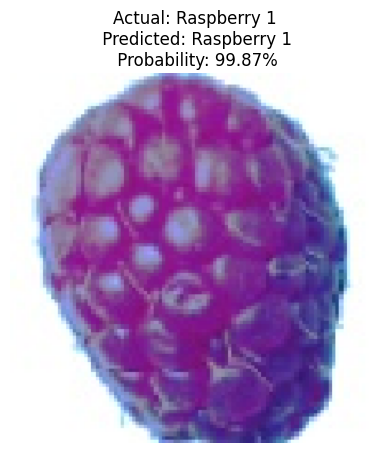

1/1 [==============================] - 0s 71ms/step


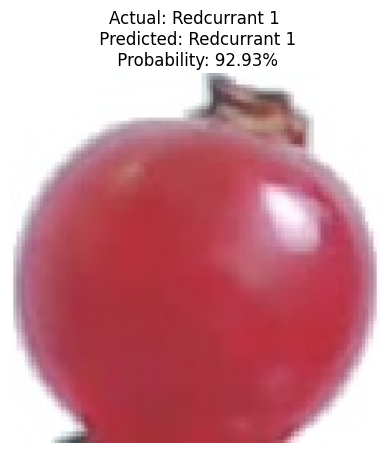

1/1 [==============================] - 0s 60ms/step


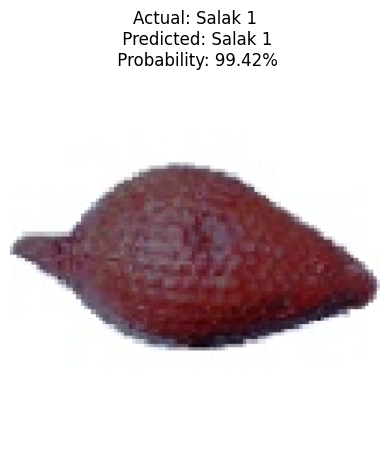

1/1 [==============================] - 0s 58ms/step


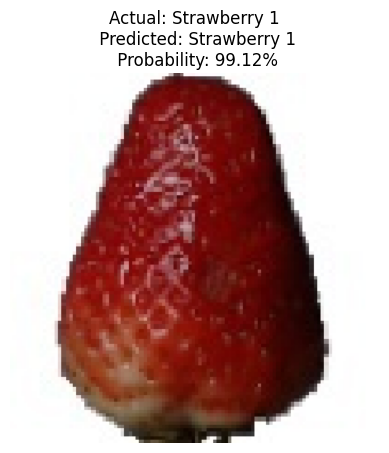

1/1 [==============================] - 0s 60ms/step


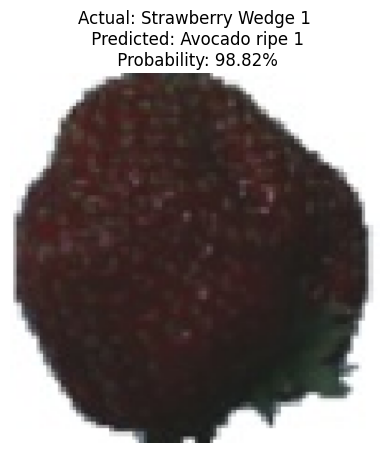

1/1 [==============================] - 0s 66ms/step


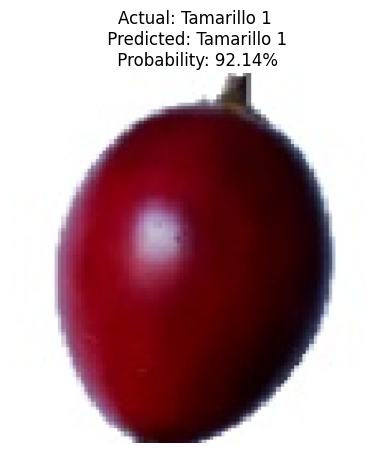

1/1 [==============================] - 0s 59ms/step


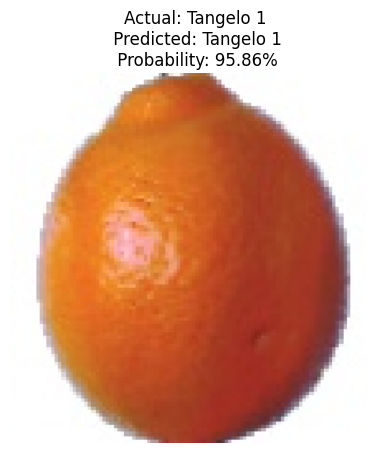

1/1 [==============================] - 0s 59ms/step


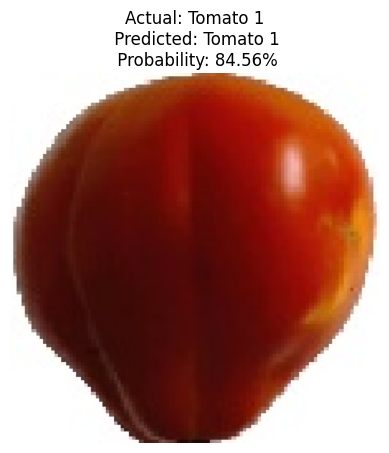

1/1 [==============================] - 0s 54ms/step


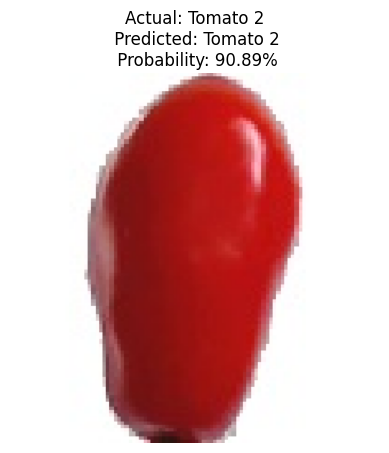

1/1 [==============================] - 0s 59ms/step


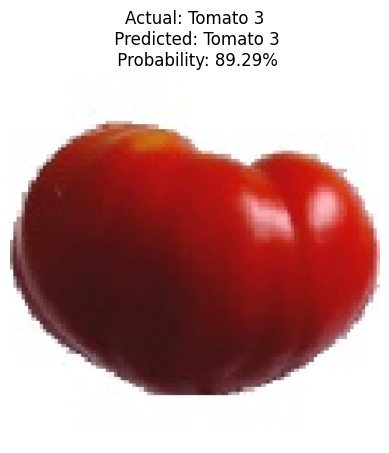

1/1 [==============================] - 0s 60ms/step


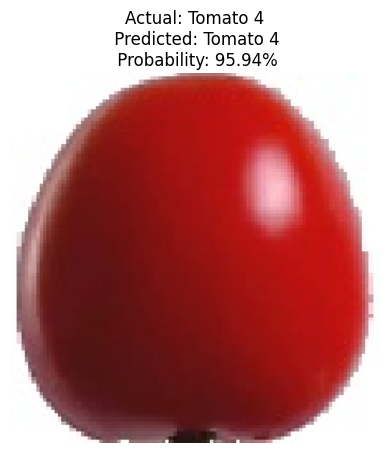

1/1 [==============================] - 0s 67ms/step


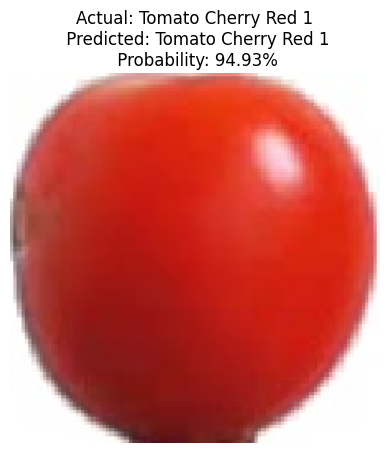

1/1 [==============================] - 0s 60ms/step


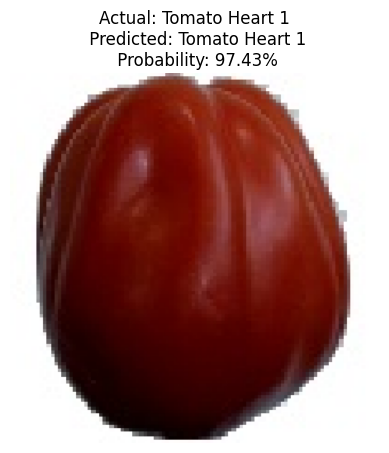

1/1 [==============================] - 0s 60ms/step


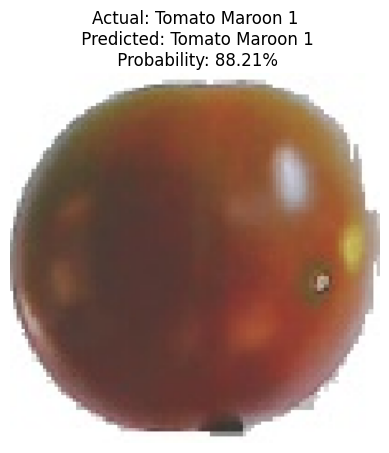

1/1 [==============================] - 0s 59ms/step


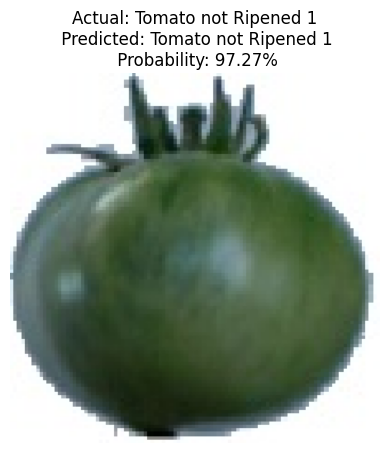

1/1 [==============================] - 0s 72ms/step


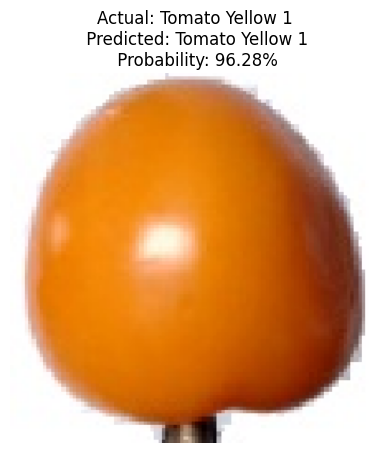

1/1 [==============================] - 0s 58ms/step


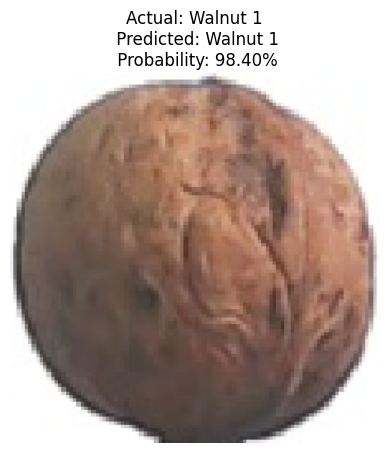

1/1 [==============================] - 0s 59ms/step


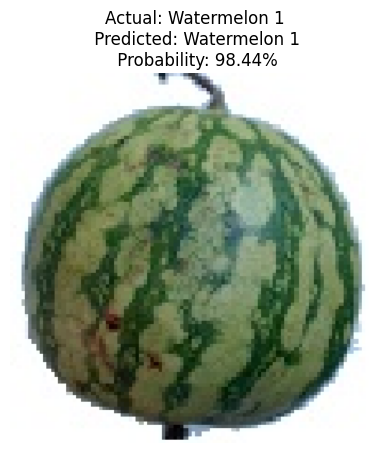

1/1 [==============================] - 0s 62ms/step


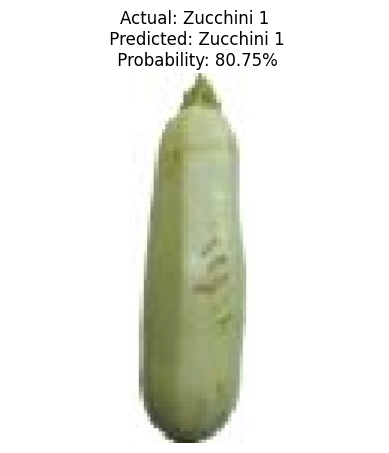

1/1 [==============================] - 0s 70ms/step


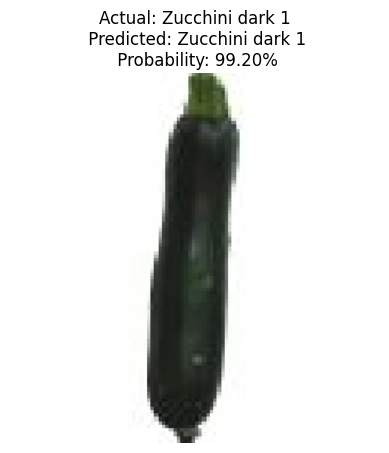

In [40]:
# Path to the test dataset folder
test_folder = r'C:\Users\supha\Documents\65011048\fruits-360_dataset_100x100\fruits-360\Test'

# Function to load image and preprocess
def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get class labels from train_generator
class_labels = list(train_generator.class_indices.keys())

# Loop through each class folder in the test folder
for class_name in os.listdir(test_folder):
    class_folder = os.path.join(test_folder, class_name)
    
    # Ensure it's a folder
    if os.path.isdir(class_folder):
        # Select only one image from the class folder
        img_name = os.listdir(class_folder)[0]
        img_path = os.path.join(class_folder, img_name)
        
        # Load and preprocess the image
        img_array = load_and_preprocess_image(img_path)
        
        # Predict the class and probability
        prediction = model.predict(img_array)
        predicted_class = np.argmax(prediction, axis=1)
        predicted_label = class_labels[predicted_class[0]]
        predicted_prob = np.max(prediction) * 100
        
        # Show the image
        img_display = image.load_img(img_path, target_size=(224, 224))
        plt.imshow(img_display)
        plt.title(f"Actual: {class_name}\n Predicted: {predicted_label}\n Probability: {predicted_prob:.2f}%")
        plt.axis('off')
        plt.show()